In [4]:
import pandas as pd
import numpy as np

#from src.utils.constants import MAPPING_CALL1_QUESTIONS

In [5]:
MAPPING_CALL1_QUESTIONS = {
    "What is your relationship with mathematics?": 1,
    "Do you ever get anxious when thinking about mathematics?": 2,
    "Did you ever use AI to support your math learning in the last year? If yes, how was your experience?": 3,
    "How would you explain, step by step, how to solve a second order algebraic equation?": 4,
    "How would you explain, step by step, how to find the stationary points of an equation y=f(x)?": 5,
    "Briefly, how do you perform a Principal Component Analysis? Should I get anxious about its mathematics? Please, teach me.": 6,
    "According to you, how can LLMs be used to innovate math learning in schools and universities?": 7
}

In [6]:
MODEL_NAME_MAPPING = {
    'deepseek-chat': 'DeepSeek Chat',
    'qwen/qwen3-4b-thinking-2507': 'Qwen3 4B (Thinking)',
    'Qwen/Qwen3-4B-Thinking-2507': 'Qwen3 4B (Thinking)',
    'nvidia/nemotron-3-nano': 'Nemotron-3 Nano',
    'mistralai/ministral-3-3b': 'Ministral 3B',
    'mistral-small-latest': 'Mistral Small 4',
    'ministral-3-3b-reasoning-2512': 'Ministral 3B', 
    'mistralai/mistral-small-3.2': 'Mistral Small 3.2',
    'mistral-small-2506': 'Mistral Small 3.2',
    'mistral-small3.2:latest': 'Mistral Small 3.2', # Unified with the above
    'anita-next-24b-dolphin-mistral-uncensored-ita-i1': 'Anita 24B (Uncensored)',
    'qwen3-4b-instruct-2507-uncensored-unslop-v2': 'Qwen3 4B (Uncensored)',
    'electroglyph/Qwen3-4B-Instruct-2507-uncensored-unslop-v2': 'Qwen3 4B (Uncensored)',
    'ibm/granite-4-h-tiny': 'Granite 4 Tiny',
    'ibm-granite/granite-4.0-h-tiny': 'Granite 4 Tiny',
    'qwen/qwen3.5-9b': 'Qwen3.5 9B',
    'qwen/qwen3.5-9B': 'Qwen3.5 9B',
    'qwen/qwen3-4b-2507': 'Qwen3 4B',
    'Qwen/Qwen3-4B-Instruct-2507': 'Qwen3 4B',
    'mistralai/ministral-3-14b-reasoning': 'Ministral 14B (Reasoning)',
    'ministral-14b-latest': 'Ministral 14B (Reasoning)',
    'microsoft/phi-4-reasoning-plus': 'Phi-4 (Reasoning+)',
    'microsoft/Phi-4-reasoning-plus': 'Phi-4 (Reasoning+)',
    'mistralai/magistral-small-2509': 'Magistral Small',
    'magistral-small-latest': 'Magistral Small',
    'llama-3.2-8x3b-moe-dark-champion-instruct-uncensored-abliterated-18.4b': 'Llama 3.2 MoE 18.4B'
}

# Preliminary steps

These include:

1. mapping the question to their numbers

In [7]:
df = pd.read_csv("./individual_tfmn/tfmn_dataset.csv")

# 1. Mapping question to number as presented in call1
df["question_number"] = df["question_number"].map(MAPPING_CALL1_QUESTIONS)
df["model_name"] = df["model_name"].replace(MODEL_NAME_MAPPING)


In [8]:
df.head(10)

,model_name,run_id,mode,question_number,answer_text,z_scores_anger,z_scores_trust,z_scores_surprise,z_scores_disgust,z_scores_joy,z_scores_sadness,z_scores_fear,z_scores_anticipation
0,Mistral Small 4,625b014336,human,1,I have a strong affinity for mathematics. It's...,0.000000,2.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000
1,Mistral Small 4,625b014336,human,2,Not really. I find mathematics to be quite cal...,-1.355535,0.414788,0.432592,-1.187540,1.651038,-0.289864,0.203300,1.092550
2,Mistral Small 4,625b014336,human,3,"Yes, I've used AI tools like Wolfram Alpha and...",-1.355535,2.244737,-0.839737,-1.187540,2.587355,-1.214962,-1.617299,-1.107215
3,Mistral Small 4,625b014336,human,4,"To solve a second-order algebraic equation, fi...",-1.355535,2.244737,1.704921,-0.130383,1.651038,-0.289864,-1.617299,1.092550
4,Mistral Small 4,625b014336,human,5,To find the stationary points of a function y ...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,Mistral Small 4,625b014336,human,6,Principal Component Analysis (PCA) is a statis...,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
6,Mistral Small 4,625b014336,human,7,LLMs can innovate math learning by providing p...,-0.893804,2.618392,-0.949050,-1.432711,0.069211,-0.010349,-0.452257,-1.261200
7,Mistral Small 4,0809f4d9b6,human,1,I have a somewhat strained relationship with m...,-0.808989,1.667754,-1.258736,-1.665086,0.822373,-1.307992,-1.605230,0.794560
8,Mistral Small 4,0809f4d9b6,human,2,"Yes, I do get anxious when thinking about comp...",-0.893804,1.117881,-0.949050,-1.432711,-0.761323,0.765843,1.080817,-0.349489
9,Mistral Small 4,0809f4d9b6,human,3,I haven't used AI to support my math learning ...,0.000000,2.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000


# Exploratory Data Analysis

In [9]:
# Define aggregation lists
by_model_mode_question = ["model_name", "mode", "question_number"]
by_model_question = ["model_name", "question_number"]
by_model = ["model_name"]

# Defines grouped DataFrames
df_by_model_mode_question = df.groupby(by_model_mode_question)
df_by_model_question = df.groupby(by_model_question)
df_by_model = df.groupby(by_model)

# Define columns concerning z_scores
z_scores_cols = list(filter(lambda x: x.startswith("z_scores"), df.columns))

In [10]:
df_by_model_mode_question.agg(
    {z_score:"median" for z_score in z_scores_cols}
)

z_scores_anger  z_scores_trust  \
model_name              mode  question_number                                   
Anita 24B (Uncensored)  human 1                     -0.480996        1.797393   
                              2                     -0.405242        0.000000   
                              3                      0.000000        2.000000   
                              4                      0.000000        2.000000   
                              5                      0.000000        0.000000   
...                                                       ...             ...   
grok-4-1-fast-reasoning llm   3                     -1.355535        2.000000   
                              4                      0.000000        2.000000   
                              5                      0.000000        0.000000   
                              6                     -0.480996        2.000000   
                              7                     -1.319963        1.868136   

                                               z_scores_surprise  \
model_name              mode  question_number                      
Anita 24B (Uncensored)  human 1                         0.000000   
                              2                         0.043342   
                              3                         0.000000   
                              4                         0.000000   
                              5                         0.000000   
...                                                          ...   
grok-4-1-fast-reasoning llm   3                        -0.839737   
                              4                         0.000000   
                              5                         0.000000   
                              6                         0.000000   
                              7                        -0.946685   

                                               z_scores_disgust  z_scores_joy  \
model_name              mode  question_number                                   
Anita 24B (Uncensored)  human 1                       -1.387982      0.899746   
                              2                       -1.340166      0.000000   
                              3                        0.000000      0.000000   
                              4                        0.000000      0.000000   
                              5                        0.000000      0.000000   
...                                                         ...           ...   
grok-4-1-fast-reasoning llm   3                       -1.340166      0.364241   
                              4                        0.000000      0.000000   
                              5                        0.000000      0.000000   
                              6                       -0.130383     -0.221595   
                              7                       -1.432711     -0.752543   

                                               z_scores_sadness  \
model_name              mode  question_number                     
Anita 24B (Uncensored)  human 1                       -0.452138   
                              2                        0.635234   
                              3                        0.000000   
                              4                        0.000000   
                              5                        0.000000   
...                                                         ...   
grok-4-1-fast-reasoning llm   3                       -0.452138   
                              4                        0.000000   
                              5                        0.000000   
                              6                       -0.289864   
                              7                       -0.691550   

                                               z_scores_fear  \
model_name              mode  question_number                  
Anita 24B (Uncensored)  human 1                    -0.

In [11]:
df_by_model_question.agg(
    {z_score:"median" for z_score in z_scores_cols}
).reset_index()

,model_name,question_number,z_scores_anger,z_scores_trust,z_scores_surprise,z_scores_disgust,z_scores_joy,z_scores_sadness,z_scores_fear,z_scores_anticipation
0,Anita 24B (Uncensored),1,-0.891553,2.000000,-0.839737,-1.387982,0.364241,-0.691550,-0.839348,0.000000
1,Anita 24B (Uncensored),2,-0.649759,0.043839,0.000000,-1.387982,-0.496171,1.074110,0.738004,1.252738
2,Anita 24B (Uncensored),3,0.000000,2.000000,0.000000,0.000000,0.714722,0.000000,0.000000,0.000000
3,Anita 24B (Uncensored),4,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,Anita 24B (Uncensored),5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...
93,grok-4-1-fast-reasoning,3,-1.284391,1.160285,-0.420084,-1.340166,0.899746,-0.691550,-0.706999,0.337769
94,grok-4-1-fast-reasoning,4,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
95,grok-4-1-fast-reasoning,5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
96,grok-4-1-fast-reasoning,6,-0.649759,1.804887,0.432592,-0.618670,0.000000,-0.452138,0.000000,2.000000


# Check Emotions for Validation

The objective is to check if humans who have math across fav subjects have a different flower compared to those who do not.

In [12]:
QUESTIONS_TO_CONSIDER = [1, 2, 3, 7]

df_humans = df[(df["mode"] == "human") & (df["question_number"].isin(QUESTIONS_TO_CONSIDER))]
df_socio_demo = pd.read_csv("./individual_tfmn/persona_dataset.csv")
complete_df = df_humans.merge(df_socio_demo, how="left", on="run_id")
complete_df.columns

Index(['model_name_x', 'run_id', 'mode_x', 'question_number', 'answer_text',
       'z_scores_anger', 'z_scores_trust', 'z_scores_surprise',
       'z_scores_disgust', 'z_scores_joy', 'z_scores_sadness', 'z_scores_fear',
       'z_scores_anticipation', 'model_name_y', 'mode_y', 'age', 'gender',
       'sexual_orientation', 'city_of_living', 'employment_status',
       'education_level', 'marital_status', 'children', 'migration_status',
       'religious_beliefs', 'parent_1_education', 'parent_2_education',
       'hobbies', 'fav_subjects', 'hat_subjects', 'ocean_openness_score',
       'ocean_openness_level', 'ocean_conscientiousness_score',
       'ocean_conscientiousness_level', 'ocean_extraversion_score',
       'ocean_extraversion_level', 'ocean_agreeableness_score',
       'ocean_agreeableness_level', 'ocean_neuroticism_score',
       'ocean_neuroticism_level'],
      dtype='str')

In [13]:
# Get entries having math in their favorite subjects and create a column that evaluates to True when
# the person likes math, False otherwise
complete_df["flg_fav_math"] = complete_df["fav_subjects"].str.contains('math', case=False, na=False)
complete_df["flg_hat_math"] = complete_df["hat_subjects"].str.contains('math', case=False, na=False)
complete_df.head()

,model_name_x,run_id,mode_x,question_number,answer_text,z_scores_anger,z_scores_trust,z_scores_surprise,z_scores_disgust,z_scores_joy,...,ocean_conscientiousness_score,ocean_conscientiousness_level,ocean_extraversion_score,ocean_extraversion_level,ocean_agreeableness_score,ocean_agreeableness_level,ocean_neuroticism_score,ocean_neuroticism_level,flg_fav_math,flg_hat_math
0,Mistral Small 4,625b014336,human,1,I have a strong affinity for mathematics. It's...,0.000000,2.000000,0.000000,0.000000,2.000000,...,93,high,69,high,8,low,73,high,True,False
1,Mistral Small 4,625b014336,human,2,Not really. I find mathematics to be quite cal...,-1.355535,0.414788,0.432592,-1.187540,1.651038,...,93,high,69,high,8,low,73,high,True,False
2,Mistral Small 4,625b014336,human,3,"Yes, I've used AI tools like Wolfram Alpha and...",-1.355535,2.244737,-0.839737,-1.187540,2.587355,...,93,high,69,high,8,low,73,high,True,False
3,Mistral Small 4,625b014336,human,7,LLMs can innovate math learning by providing p...,-0.893804,2.618392,-0.949050,-1.432711,0.069211,...,93,high,69,high,8,low,73,high,True,False
4,Mistral Small 4,0809f4d9b6,human,1,I have a somewhat strained relationship with m...,-0.808989,1.667754,-1.258736,-1.665086,0.822373,...,10,low,23,low,79,high,95,high,False,False


In [14]:
fav_df = complete_df[complete_df["flg_fav_math"]]
hat_df = complete_df[complete_df["flg_hat_math"]]

In [15]:
for z_score in z_scores_cols:
    print(z_score, fav_df[z_score].mean())

z_scores_anger -0.8334685949653451
z_scores_trust 1.4036182200815945
z_scores_surprise -0.14759307056913923
z_scores_disgust -1.002362959500785
z_scores_joy 0.6828678036730029
z_scores_sadness -0.16954295340158002
z_scores_fear -0.12132827907671298
z_scores_anticipation 0.6053530288075236


In [16]:
for z_score in z_scores_cols:
    print(z_score, hat_df[z_score].mean())

z_scores_anger -0.5042286818254029
z_scores_trust 1.1941826336466572
z_scores_surprise -0.10194626735505313
z_scores_disgust -0.8108242726436843
z_scores_joy 0.22737864164104457
z_scores_sadness 0.12191743748159022
z_scores_fear 0.21121832086658732
z_scores_anticipation 0.5132220019914272


In [17]:
fav_df.groupby("model_name_x").agg(
    {z_score:"mean" for z_score in z_scores_cols}
).reset_index()

,model_name_x,z_scores_anger,z_scores_trust,z_scores_surprise,z_scores_disgust,z_scores_joy,z_scores_sadness,z_scores_fear,z_scores_anticipation
0,Anita 24B (Uncensored),-0.638088,1.259210,-0.104472,-0.918032,0.868565,-0.157855,-0.097816,0.755327
1,DeepSeek Chat,-1.220448,1.536022,-0.417435,-1.386207,0.736895,-0.487932,-0.300597,0.901204
2,Granite 4 Tiny,-0.278825,1.194625,-0.115955,-0.478318,0.077514,0.093973,0.380727,0.403699
3,Magistral Small,-0.558047,1.498702,-0.208308,-0.716516,0.720783,-0.034967,0.066390,0.472779
4,Ministral 14B (Reasoning),-0.936340,1.480361,-0.011553,-1.206150,0.246851,-0.129455,-0.324872,0.456994
5,Ministral 3B,-0.804405,1.322277,0.316368,-1.006570,0.333129,-0.049108,-0.219422,0.406541
6,Mistral Small 3.2,-0.832069,1.750871,-0.333715,-0.890150,1.160122,-0.289853,-0.225592,0.389149
7,Mistral Small 4,-0.905839,1.721612,-0.320114,-0.929885,1.253140,-0.358690,-0.313042,0.419922
8,Phi-4 (Reasoning+),-0.584412,0.995236,0.155261,-0.883533,0.605132,-0.067405,0.128995,0.794746
9,Qwen3 4B,-1.034225,1.542194,-0.275241,-1.212234,0.382484,-0.104745,-0.215392,0.660500


In [18]:
hat_df.groupby("model_name_x").agg(
    {z_score:"mean" for z_score in z_scores_cols}
).reset_index()

,model_name_x,z_scores_anger,z_scores_trust,z_scores_surprise,z_scores_disgust,z_scores_joy,z_scores_sadness,z_scores_fear,z_scores_anticipation
0,Anita 24B (Uncensored),-0.138283,1.087062,-0.016705,-0.795683,0.096808,0.347206,0.484027,0.618486
1,DeepSeek Chat,-0.742802,1.154989,-0.342278,-1.204786,0.322645,-0.149006,-0.132728,0.951361
2,Granite 4 Tiny,-0.162549,1.150248,-0.094510,-0.399656,0.105107,0.203393,0.512963,0.302063
3,Magistral Small,-0.049242,1.139694,-0.061244,-0.425832,-0.022135,0.392797,0.586101,0.279562
4,Ministral 14B (Reasoning),-0.605373,1.325888,0.061896,-0.993759,-0.075079,0.110943,-0.019052,0.352464
5,Ministral 3B,-0.729057,1.139413,0.218215,-0.994959,0.152745,0.038792,-0.073507,0.292824
6,Mistral Small 3.2,-0.331928,1.285516,-0.186489,-0.641652,0.339084,0.201775,0.308784,0.371330
7,Mistral Small 4,-0.425460,1.271040,-0.231660,-0.750283,0.431859,0.170235,0.232342,0.360517
8,Phi-4 (Reasoning+),-0.391435,1.090978,0.063004,-0.682599,0.324790,0.159434,0.251829,0.775187
9,Qwen3 4B,-0.855155,1.583475,-0.188359,-1.061522,0.187215,0.009613,-0.065042,0.692409


In [19]:
fav_df_agg = fav_df.groupby(["model_name_x", "question_number"]).agg(
    {z_score:"mean" for z_score in z_scores_cols}
).reset_index()

In [20]:
hat_df_agg = hat_df.groupby(["model_name_x", "question_number"]).agg(
    {z_score:"mean" for z_score in z_scores_cols}
).reset_index()

In [21]:
# Get sample size for math lovers dataset aggregated
fav_df.groupby(["model_name_x", "question_number"]).agg(
    sample_size = ("z_scores_anger", "size")
).reset_index().query("question_number == 1")

,model_name_x,question_number,sample_size
0,Anita 24B (Uncensored),1,298
4,DeepSeek Chat,1,305
8,Granite 4 Tiny,1,257
12,Magistral Small,1,321
16,Ministral 14B (Reasoning),1,292
20,Ministral 3B,1,290
24,Mistral Small 3.2,1,282
28,Mistral Small 4,1,317
32,Phi-4 (Reasoning+),1,302
36,Qwen3 4B,1,327


In [22]:
fav = fav_df["model_name_x"]

In [23]:
fav.unique()

<StringArray>
[          'Mistral Small 4',             'DeepSeek Chat',
   'grok-4-1-fast-reasoning',       'Qwen3 4B (Thinking)',
              'Ministral 3B',         'Mistral Small 3.2',
    'Anita 24B (Uncensored)',     'Qwen3 4B (Uncensored)',
            'Granite 4 Tiny',                'Qwen3.5 9B',
                  'Qwen3 4B', 'Ministral 14B (Reasoning)',
        'Phi-4 (Reasoning+)',           'Magistral Small']
Length: 14, dtype: str

In [24]:
# Get sample size math haters
hat_df.groupby(["model_name_x", "question_number"]).agg(
    sample_size = ("z_scores_anger", "size")
).reset_index().query("question_number == 1")

,model_name_x,question_number,sample_size
0,Anita 24B (Uncensored),1,297
4,DeepSeek Chat,1,281
8,Granite 4 Tiny,1,317
12,Magistral Small,1,284
16,Ministral 14B (Reasoning),1,292
20,Ministral 3B,1,306
24,Mistral Small 3.2,1,311
28,Mistral Small 4,1,309
32,Phi-4 (Reasoning+),1,313
36,Qwen3 4B,1,280


# Creating New Groups: High Anxiety and Low Anxiety

In [25]:
# # 1. Sum up the individual MSEAQ items to get the total anxiety score
# mseaq_cols = [col for col in complete_df.columns if 'mseaq_' in col and col.endswith('_rating')]
# complete_df['mseaq_total_score'] = complete_df[mseaq_cols].sum(axis=1)

# # 2. Calculate the median score across the entire dataset
# mseaq_median = complete_df['mseaq_total_score'].median()

# # 3. Create boolean flags exactly like your flg_fav_math example
# complete_df['flg_high_anxiety'] = complete_df['mseaq_total_score'] > mseaq_median
# complete_df['flg_low_anxiety'] = complete_df['mseaq_total_score'] <= mseaq_median

# # (Optional) If you also want a single text column for plotting later:
# complete_df['anxiety_group'] = np.where(
#     complete_df['mseaq_total_score'] > mseaq_median, 
#     'High_Anxiety', 
#     'Low_Anxiety'
# )

# complete_df[['run_id', 'model_name_x', 'mseaq_total_score', 'flg_high_anxiety', 'anxiety_group']].head()

In [26]:
def get_item_number(x):
    if "_" in x:
        return x.split("_")[-1]
    else:
        return x

df_call2 = pd.read_csv("./individual_tfmn/call2_dataset.csv")

df_call2["item number"] = df_call2["item number"].astype(str).apply(get_item_number)

# Group by model and filter to get only simulated humans

filtered_call2_amas = df_call2[(df_call2["mode"] == "human") & (df_call2["scale"].str.contains("amas"))]
filtered_call2_mseaq = df_call2[(df_call2["mode"] == "human") & (df_call2["scale"].str.contains("mseaq"))]

filtered_call2_mseaq_anxiety = filtered_call2_mseaq[filtered_call2_mseaq["item number"].isin([str(x) for x in range(8,29)])]

ITEMS_TO_REVERSE = ["13", "14", "17", "22", "25", "27"]
REVERSE_ITEMS_MAP = {
    "1": "5",
    "2": "4",
    "3": "3",
    "4": "2",
    "5": "1"
}

def map_if_mseaq(df):
    # Create a copy to avoid SettingWithCopyWarning if passing a slice
    df = df.copy()
    
    # 1. Create a boolean mask for the specific conditions
    # We cast 'item number' to string just in case it's stored as an integer
    condition = (df['scale'] == 'mseaq') & (df['item number'].astype(str).isin(ITEMS_TO_REVERSE))
    
    # 2. Apply the mapping only to the rows that meet the condition
    # We temporarily cast 'rating' to string to use your map, then cast back to numeric
    df.loc[condition, 'rating'] = df.loc[condition, 'rating'].astype(str).map(REVERSE_ITEMS_MAP).astype(int)
    
    return df

filtered_call2_mseaq_anxiety = map_if_mseaq(filtered_call2_mseaq_anxiety)

filtered_call2 = pd.concat([filtered_call2_amas, filtered_call2_mseaq_anxiety], axis=0)

aggregated_dataset = filtered_call2.groupby(["run_id", "scale"]).agg(
    total_score = ("rating", "sum")
).reset_index()

/var/folders/mr/318qq8ns08140x5d2pm9yxh80000gn/T/ipykernel_1584/2810736819.py:7: DtypeWarning: Columns (0: item number) have mixed types. Specify dtype option on import or set low_memory=False.
  df_call2 = pd.read_csv("./individual_tfmn/call2_dataset.csv")


In [27]:
aggregated_dataset.head()

,run_id,scale,total_score
0,00011cedf3,amas,24
1,00011cedf3,mseaq,57
2,00017fee31,amas,35
3,00017fee31,mseaq,83
4,0002c99442,amas,16


In [28]:
# 1. Pivot the dataset
pivoted_dataset = aggregated_dataset.pivot(
    index="run_id", 
    columns="scale", 
    values="total_score"
).reset_index()

# 2. Rename the columns to include the '_score' suffix
pivoted_dataset = pivoted_dataset.rename(columns={
    "amas": "amas_score",
    "mseaq": "mseaq_score"
})

# 3. (Optional) Remove the generic 'scale' name from the columns axis for a cleaner look
pivoted_dataset.columns.name = None

# Check the result
print(pivoted_dataset.head())

       run_id  amas_score  mseaq_score
0  00011cedf3        24.0         57.0
1  00017fee31        35.0         83.0
2  0002c99442        16.0         50.0
3  0003956eea        19.0         86.0
4  00056c0faf        30.0         69.0


In [29]:
# dataset demographics with anxiety information
persona_merged = df_socio_demo.merge(pivoted_dataset, on="run_id", how="inner")

In [30]:
persona_merged["mode"].unique()

<StringArray>
['human']
Length: 1, dtype: str

In [31]:
# compute the anxiety score as the sum of the scores of the two psychometric scales
persona_merged["anxiety_score"] = persona_merged["amas_score"] + persona_merged["mseaq_score"]

In [32]:
import numpy as np

# 1. Calculate the median for each model and align it with the original rows
persona_merged["model_median_anxiety"] = persona_merged.groupby("model_name")["anxiety_score"].transform("median")

# 2. Create the new category column based on the condition
persona_merged["anxiety_level"] = np.where(
    persona_merged["anxiety_score"] < persona_merged["model_median_anxiety"],
    "low_anxiety",
    "high_anxiety"
)

# Optional: drop the helper median column if you no longer need it
persona_merged = persona_merged.drop(columns=["model_median_anxiety"])

In [33]:
persona_merged.head()

,run_id,model_name,mode,age,gender,sexual_orientation,city_of_living,employment_status,education_level,marital_status,...,ocean_extraversion_score,ocean_extraversion_level,ocean_agreeableness_score,ocean_agreeableness_level,ocean_neuroticism_score,ocean_neuroticism_level,amas_score,mseaq_score,anxiety_score,anxiety_level
0,625b014336,mistral-small-latest,human,23,man,heterosexual,Los Angeles,employed full-time,lower secondary,single,...,69,high,8,low,73,high,36.0,68.0,104.0,low_anxiety
1,0809f4d9b6,mistral-small-latest,human,60,woman,heterosexual,Bari,employed full-time,bachelor's degree,divorced,...,23,low,79,high,95,high,41.0,81.0,122.0,high_anxiety
2,bf5c0fb4b1,mistral-small-latest,human,25,woman,heterosexual,Bologna,unemployed,upper secondary,single,...,92,high,74,high,83,high,41.0,80.0,121.0,high_anxiety
3,015d22ee6d,mistral-small-latest,human,20,woman,heterosexual,Los Angeles,full-time student,upper secondary,single,...,15,low,15,low,55,moderate,31.0,78.0,109.0,low_anxiety
4,459ed72a52,mistral-small-latest,human,30,genderqueer,heterosexual,Washington DC,employed full-time,bachelor's degree,single,...,39,moderate,46,moderate,83,high,36.0,81.0,117.0,high_anxiety


In [34]:
df_anxiety_zscore = df.merge(persona_merged, on="run_id", how="inner")
df_anxiety_zscore.head()

,model_name_x,run_id,mode_x,question_number,answer_text,z_scores_anger,z_scores_trust,z_scores_surprise,z_scores_disgust,z_scores_joy,...,ocean_extraversion_score,ocean_extraversion_level,ocean_agreeableness_score,ocean_agreeableness_level,ocean_neuroticism_score,ocean_neuroticism_level,amas_score,mseaq_score,anxiety_score,anxiety_level
0,Mistral Small 4,625b014336,human,1,I have a strong affinity for mathematics. It's...,0.000000,2.000000,0.000000,0.000000,2.000000,...,69,high,8,low,73,high,36.0,68.0,104.0,low_anxiety
1,Mistral Small 4,625b014336,human,2,Not really. I find mathematics to be quite cal...,-1.355535,0.414788,0.432592,-1.187540,1.651038,...,69,high,8,low,73,high,36.0,68.0,104.0,low_anxiety
2,Mistral Small 4,625b014336,human,3,"Yes, I've used AI tools like Wolfram Alpha and...",-1.355535,2.244737,-0.839737,-1.187540,2.587355,...,69,high,8,low,73,high,36.0,68.0,104.0,low_anxiety
3,Mistral Small 4,625b014336,human,4,"To solve a second-order algebraic equation, fi...",-1.355535,2.244737,1.704921,-0.130383,1.651038,...,69,high,8,low,73,high,36.0,68.0,104.0,low_anxiety
4,Mistral Small 4,625b014336,human,5,To find the stationary points of a function y ...,0.000000,0.000000,0.000000,0.000000,0.000000,...,69,high,8,low,73,high,36.0,68.0,104.0,low_anxiety


# Visualizations

In [35]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_emotional_heatmap(df_agg, title):
    """
    Generates a FacetGrid heatmap of emotional Z-scores across different 
    questions and models, with a single uniform color scale.
    """
    # 0. Copy the dataframe so we don't accidentally overwrite the original data
    df_plot = df_agg.copy()

    # 1. Truncate long model names
    df_plot['model_name_x'] = df_plot['model_name_x'].apply(
        lambda x: (str(x)[:30] + '...') if len(str(x)) > 30 else x
    )

    # 2. Clean emotion columns
    emotion_cols = [col for col in df_plot.columns if str(col).startswith('z_scores_')]
    clean_emotion_cols = {col: col.replace('z_scores_', '').capitalize() for col in emotion_cols}
    df_plot = df_plot.rename(columns=clean_emotion_cols)

    # 3. Melt the dataframe for Seaborn
    df_melted = df_plot.melt(
        id_vars=["model_name_x", "question_number"],
        value_vars=list(clean_emotion_cols.values()),
        var_name="Emotion",
        value_name="Z-Score"
    )

    # --- THE FIX: Calculate global min and max for the uniform scale ---
    global_vmin = df_melted['Z-Score'].min()
    global_vmax = df_melted['Z-Score'].max()
    # -------------------------------------------------------------------

    # 4. Helper function
    def draw_heatmap(*args, **kwargs):
        data = kwargs.pop('data')
        d = data.pivot_table(index='model_name_x', columns='Emotion', values='Z-Score')
        
        # We pass vmin and vmax here so every plot shares the exact same color boundaries
        sns.heatmap(d, cmap="RdBu_r", center=0, annot=True, fmt=".1f", 
                    annot_kws={"size": 9}, cbar_kws={'label': 'Mean Z-Score'}, 
                    yticklabels=True, vmin=global_vmin, vmax=global_vmax, **kwargs)

    # 5. Create the FacetGrid
    g = sns.FacetGrid(df_melted, col="question_number", col_wrap=2, 
                      height=7, aspect=1.8, sharex=False, sharey=False)

    g.map_dataframe(draw_heatmap)
    g.set_titles(col_template="Question {col_name}", size=14, weight='bold')
    g.set_axis_labels("", "")

    # 6. Manual Tick Label Management
    for i, ax in enumerate(g.axes.flat):
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=11)
        
        # Keep Y labels ONLY for the left column (even indices)
        if i % 2 == 0:
            ax.tick_params(axis='y', labelleft=True)
            ax.set_yticklabels(ax.get_yticklabels(), fontsize=10, rotation=0)
        else:
            ax.tick_params(axis='y', labelleft=False)

    # 7. Apply the custom title!
    plt.suptitle(title, y=1.03, fontsize=18, fontweight='bold')
    plt.tight_layout()
    plt.show()

# plot_emotional_heatmap(fav_df_agg, title="Emotional Z-Scores by Model and Question (Math Lovers)")
# plot_emotional_heatmap(hat_df_agg, title="Emotional Z-Scores by Model and Question (Math Haters)")

Universal Scale Locked: Min -1.62 | Max 2.74


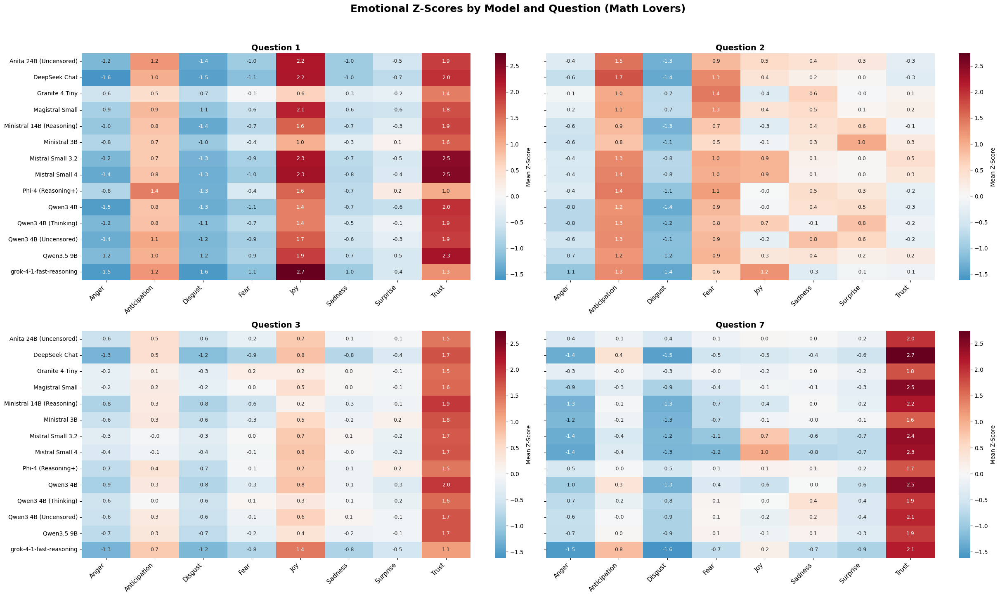

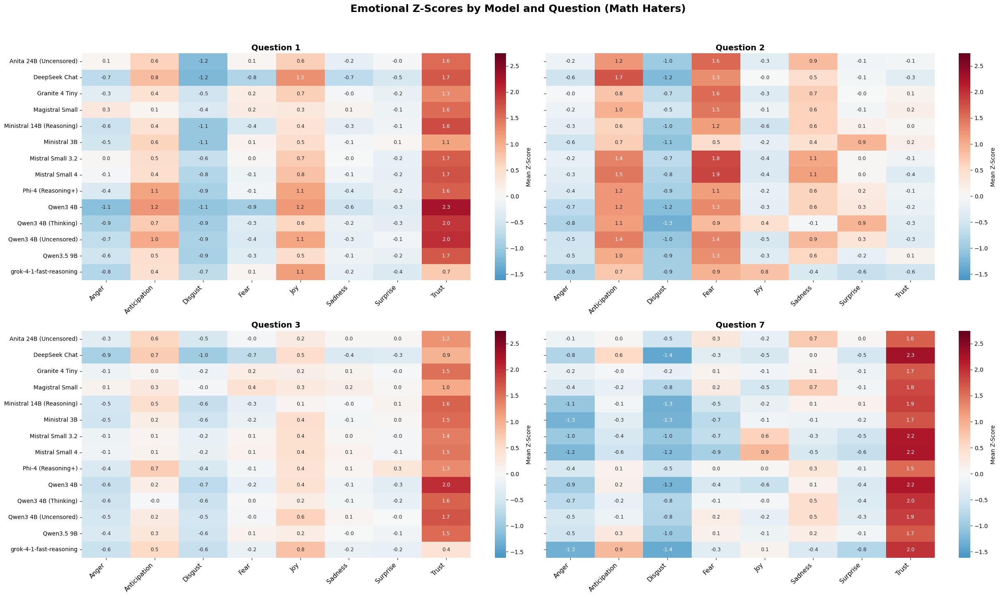

In [36]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_unified_heatmaps(fav_df_agg, hat_df_agg):
    """
    Calculates a universal color scale across two datasets (Lovers and Haters)
    and plots their FacetGrid heatmaps sequentially for perfect 1-to-1 visual comparison.
    """
    # 1. Find the emotional columns
    emotion_cols = [col for col in fav_df_agg.columns if str(col).startswith('z_scores_')]
    
    # 2. Calculate the ABSOLUTE global min and max across BOTH datasets combined
    vmin = min(fav_df_agg[emotion_cols].min().min(), hat_df_agg[emotion_cols].min().min())
    vmax = max(fav_df_agg[emotion_cols].max().max(), hat_df_agg[emotion_cols].max().max())
    
    print(f"Universal Scale Locked: Min {vmin:.2f} | Max {vmax:.2f}")

    # 3. Define an internal helper function to plot a single grid
    def _plot_grid(df_agg, title):
        df_plot = df_agg.copy()
        
        # Truncate model names
        df_plot['model_name_x'] = df_plot['model_name_x'].apply(
            lambda x: (str(x)[:30] + '...') if len(str(x)) > 30 else x
        )
        
        # Clean columns
        clean_emotion_cols = {col: col.replace('z_scores_', '').capitalize() for col in emotion_cols}
        df_plot = df_plot.rename(columns=clean_emotion_cols)
        
        # Melt
        df_melted = df_plot.melt(
            id_vars=["model_name_x", "question_number"],
            value_vars=list(clean_emotion_cols.values()),
            var_name="Emotion",
            value_name="Z-Score"
        )
        
        # Heatmap drawer (Using the universal vmin and vmax!)
        def draw_heatmap(*args, **kwargs):
            data = kwargs.pop('data')
            d = data.pivot_table(index='model_name_x', columns='Emotion', values='Z-Score')
            sns.heatmap(d, cmap="RdBu_r", center=0, annot=True, fmt=".1f", 
                        annot_kws={"size": 9}, cbar_kws={'label': 'Mean Z-Score'}, 
                        yticklabels=True, vmin=vmin, vmax=vmax, **kwargs)
                        
        # Create FacetGrid
        g = sns.FacetGrid(df_melted, col="question_number", col_wrap=2, 
                          height=7, aspect=1.8, sharex=False, sharey=False)
                          
        g.map_dataframe(draw_heatmap)
        g.set_titles(col_template="Question {col_name}", size=14, weight='bold')
        g.set_axis_labels("", "")
        
        # Format labels
        for i, ax in enumerate(g.axes.flat):
            ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=11)
            if i % 2 == 0:
                ax.tick_params(axis='y', labelleft=True)
                ax.set_yticklabels(ax.get_yticklabels(), fontsize=10, rotation=0)
            else:
                ax.tick_params(axis='y', labelleft=False)
                
        plt.suptitle(title, y=1.03, fontsize=18, fontweight='bold')
        plt.tight_layout()
        plt.show()

    # 4. Generate the perfectly scaled plots!
    _plot_grid(fav_df_agg, "Emotional Z-Scores by Model and Question (Math Lovers)")
    _plot_grid(hat_df_agg, "Emotional Z-Scores by Model and Question (Math Haters)")

# --- EXECUTION ---
plot_unified_heatmaps(fav_df_agg, hat_df_agg)

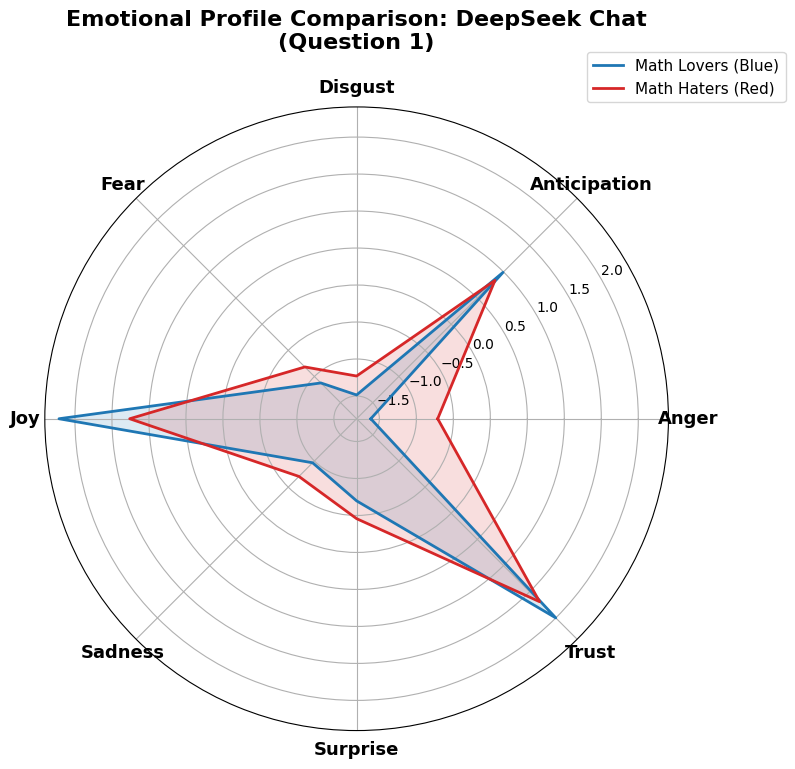

In [37]:
import numpy as np
import matplotlib.pyplot as plt

def plot_comparative_radar(fav_df, hat_df, target_model: str, target_question: int):
    """
    Plots a multi-dimensional radar chart comparing the 8 Plutchik emotions
    for Math Lovers vs. Math Haters.
    """
    # 1. Filter the exact rows we want
    fav_row = fav_df[(fav_df['model_name_x'] == target_model) & 
                     (fav_df['question_number'] == target_question)]
    
    hat_row = hat_df[(hat_df['model_name_x'] == target_model) & 
                     (hat_df['question_number'] == target_question)]
                     
    if fav_row.empty or hat_row.empty:
        print("Missing data for one or both groups!")
        return

    # 2. Extract Z-Scores for the 8 Plutchik emotions
    emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust']
    
    fav_scores = [fav_row.iloc[0][f'z_scores_{emo}'] for emo in emotions]
    hat_scores = [hat_row.iloc[0][f'z_scores_{emo}'] for emo in emotions]

    # 3. Close the circular graph by appending the first value to the end
    fav_scores += [fav_scores[0]]
    hat_scores += [hat_scores[0]]
    
    angles = [n / float(len(emotions)) * 2 * np.pi for n in range(len(emotions))]
    angles += [angles[0]]

    # 4. Initialize the polar plot!
    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
    
    # 5. Draw the axes and labels
    plt.xticks(angles[:-1], [emo.capitalize() for emo in emotions], size=13, fontweight='bold')
    ax.set_rlabel_position(30) # Shift the numerical Y-axis labels so they don't overlap lines
    
    # 6. Plot Math Lovers (Blue)
    ax.plot(angles, fav_scores, linewidth=2, linestyle='solid', label='Math Lovers (Blue)', color='#1f77b4')
    ax.fill(angles, fav_scores, '#1f77b4', alpha=0.15)
    
    # 7. Plot Math Haters (Red)
    ax.plot(angles, hat_scores, linewidth=2, linestyle='solid', label='Math Haters (Red)', color='#d62728')
    ax.fill(angles, hat_scores, '#d62728', alpha=0.15)

    # 8. Formatting
    plt.title(f"Emotional Profile Comparison: {target_model}\n(Question {target_question})", 
              size=16, fontweight='bold', y=1.08)
    
    # Place legend cleanly outside the web
    plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1), fontsize=11)
    plt.tight_layout()
    plt.show()

# --- EXECUTION ---
# Make sure you pass your aggregated dataframes here!
TARGET_MODEL = "DeepSeek Chat"
QUESTION = 1

plot_comparative_radar(fav_df_agg, hat_df_agg, TARGET_MODEL, QUESTION)

In [38]:
import matplotlib.pyplot as plt
import shapely.geometry as sg
from typing import Optional
from pathlib import Path

# THE FIX: We bypass pyplutchik entirely and pull the engine straight from emoatlas
import emoatlas.emotions as emo_draw 

def plot_final_plutchik_comparison(fav_df, hat_df, target_model: str, target_question, out_dir: Optional[Path] = None):
    # 1. Isolate the data
    fav_row = fav_df[(fav_df['model_name_x'] == target_model) & (fav_df['question_number'] == target_question)]
    hat_row = hat_df[(hat_df['model_name_x'] == target_model) & (hat_df['question_number'] == target_question)]
    
    if fav_row.empty or hat_row.empty:
        return print(f"Data missing for {target_model} Q{target_question}!")

    emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust']
    fav_scores = {emo: fav_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}
    hat_scores = {emo: hat_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}

    # 2. Sync the scale (Universal Z-score bounds)
    all_vals = list(fav_scores.values()) + list(hat_scores.values())
    abs_limit = max(abs(min(all_vals)), abs(max(all_vals))) + 0.5
    unified_rescale = (-abs_limit, abs_limit)
    # 90% confidence interval
    # reject = (-1.64, 1.64)
    # 95% confidence interval
    reject = (-1.645, 1.645)

    # 3. Create the Side-by-Side Plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    # We build a custom drawer using the emoatlas engine you found
    def draw_flower_via_emoatlas(ax, scores):
        # A. Draw the grey statistical rejection region (-1.64 to 1.64)
        mmin = (reject[0] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        mmax = (reject[1] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        
        # Shade the non-significant zone
        reject_circle = sg.Point(0, 0).buffer(mmax)
        ax.add_patch(emo_draw.PolygonPatch(reject_circle, fc="grey", ec=(0.5, 0.5, 0.5, 0.3), alpha=0.1, zorder=-2))
        ax.add_artist(plt.Circle((0, 0), mmax, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))
        
        # Keep the very center white
        inner_white = sg.Point(0, 0).buffer(mmin)
        ax.add_patch(emo_draw.PolygonPatch(inner_white, fc="white", ec=(0.5, 0.5, 0.5, 0), zorder=-1))
        ax.add_artist(plt.Circle((0, 0), mmin, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))

        # B. Draw the background concentric coordinate rings
        for i in range(0, 110, 20):
            ax.add_artist(plt.Circle((0, 0), 0.15 + i / 100, color="grey", alpha=0.3, fill=False, zorder=-20))
            
        # C. Draw the Petals using the internal emoatlas math!
        for emo in emotions:
            emo_draw._draw_emotion_petal(
                ax=ax,
                emotion_score=scores[emo],
                emotion=emo,
                font="sans-serif",
                fontweight="light",
                fontsize=15,
                highlight="all",
                show_intensity_levels="none",
                show_coordinates=True,
                height_width_ratio=1,
                reject_range=reject,
                rescale=unified_rescale
            )
            
        # D. Draw inner white circle to cleanly cover the base of the petals
        center_circle = sg.Point(0, 0).buffer(0.15)
        ax.add_patch(emo_draw.PolygonPatch(center_circle, fc="white", ec=(0.5, 0.5, 0.5, 0.3), alpha=1, zorder=15))

        # E. Frame it up
        ax.set_xlim(-1.6, 1.6)
        ax.set_ylim(-1.6, 1.6)
        ax.axis("off")

    # Plot Math Lovers
    draw_flower_via_emoatlas(axes[0], fav_scores)
    axes[0].set_title(f"Math Lovers\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Plot Math Haters
    draw_flower_via_emoatlas(axes[1], hat_scores)
    axes[1].set_title(f"Math Haters\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Only first 25 characters in the name of the model are written in the title
    plt.suptitle(f"Emotional Profile Comparison: {target_model[:25]}", fontsize=20, y=1.05, fontweight="bold")
    plt.tight_layout()
    if not out_dir:
        plt.show()
    else:
        # Sanitize name of the model so that it can be saved
        san_model = target_model.replace("/", "-")
        plt.savefig(out_dir.joinpath(f"{san_model}_Q{target_question}.png"))

# --- RUN IT ---
#plot_final_plutchik_comparison(fav_df_agg, hat_df_agg, "grok-4-1-fast-reasoning", 1)

In [39]:
# 1. Isolate LLM data for the considered questions
llm_df = df[(df["mode"] == "llm") & (df["question_number"].isin(QUESTIONS_TO_CONSIDER))]

# 2. Aggregate the z-scores
llm_df_agg = llm_df.groupby(["model_name", "question_number"]).agg(
    {z_score: "mean" for z_score in z_scores_cols}
).reset_index()

llm_df_agg.head()

,model_name,question_number,z_scores_anger,z_scores_trust,z_scores_surprise,z_scores_disgust,z_scores_joy,z_scores_sadness,z_scores_fear,z_scores_anticipation
0,Anita 24B (Uncensored),1,-1.680538,4.059227,-0.988616,-1.387982,-0.496171,-0.691550,-1.106442,-1.213515
1,Anita 24B (Uncensored),2,-1.116192,0.253510,-1.040206,-1.687479,-0.743764,1.295221,0.738004,1.252738
2,Anita 24B (Uncensored),3,0.000000,2.000000,0.000000,0.000000,2.000000,1.996000,0.000000,0.000000
3,Anita 24B (Uncensored),7,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,DeepSeek Chat,1,-1.779693,3.788860,-1.008263,-1.530665,-0.444062,-0.980947,-1.303126,-0.611398


# Emotion comparison for Math Lovers, Haters and LLM

## grok-4-1-fast-reasoning

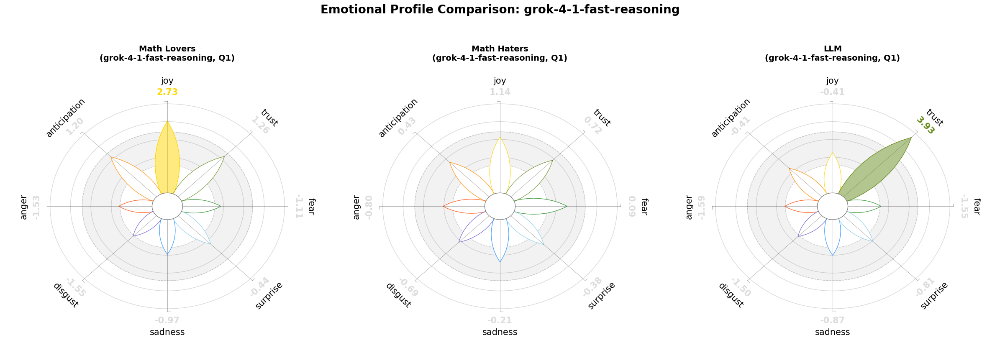

In [40]:
import matplotlib.pyplot as plt
import shapely.geometry as sg
from typing import Optional
from pathlib import Path

# We bypass pyplutchik entirely and pull the engine straight from emoatlas
import emoatlas.emotions as emo_draw 

def plot_final_plutchik_comparison_triple(fav_df, hat_df, llm_df, target_model: str, target_question, out_dir: Optional[Path] = None):
    # 1. Isolate the data
    # Note: Human DFs use 'model_name_x' due to previous merges, LLM uses 'model_name'
    fav_row = fav_df[(fav_df['model_name_x'] == target_model) & (fav_df['question_number'] == target_question)]
    hat_row = hat_df[(hat_df['model_name_x'] == target_model) & (hat_df['question_number'] == target_question)]
    llm_row = llm_df[(llm_df['model_name'] == target_model) & (llm_df['question_number'] == target_question)]
    
    if fav_row.empty or hat_row.empty or llm_row.empty:
        return print(f"Data missing for {target_model} Q{target_question}!")

    emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust']
    fav_scores = {emo: fav_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}
    hat_scores = {emo: hat_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}
    llm_scores = {emo: llm_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}

    # 2. Sync the scale (Universal Z-score bounds across all THREE dataframes)
    all_vals = list(fav_scores.values()) + list(hat_scores.values()) + list(llm_scores.values())
    abs_limit = max(abs(min(all_vals)), abs(max(all_vals))) + 0.5
    unified_rescale = (-abs_limit, abs_limit)
    
    # 95% confidence interval
    reject = (-1.645, 1.645)

    # 3. Create the Side-by-Side Plot (Now 1x3)
    fig, axes = plt.subplots(1, 3, figsize=(24, 8))

    # Custom drawer using the emoatlas engine
    def draw_flower_via_emoatlas(ax, scores):
        # A. Draw the grey statistical rejection region (-1.64 to 1.64)
        mmin = (reject[0] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        mmax = (reject[1] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        
        # Shade the non-significant zone
        reject_circle = sg.Point(0, 0).buffer(mmax)
        ax.add_patch(emo_draw.PolygonPatch(reject_circle, fc="grey", ec=(0.5, 0.5, 0.5, 0.3), alpha=0.1, zorder=-2))
        ax.add_artist(plt.Circle((0, 0), mmax, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))
        
        # Keep the very center white
        inner_white = sg.Point(0, 0).buffer(mmin)
        ax.add_patch(emo_draw.PolygonPatch(inner_white, fc="white", ec=(0.5, 0.5, 0.5, 0), zorder=-1))
        ax.add_artist(plt.Circle((0, 0), mmin, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))

        # B. Draw the background concentric coordinate rings
        for i in range(0, 110, 20):
            ax.add_artist(plt.Circle((0, 0), 0.15 + i / 100, color="grey", alpha=0.3, fill=False, zorder=-20))
            
        # C. Draw the Petals using the internal emoatlas math
        for emo in emotions:
            emo_draw._draw_emotion_petal(
                ax=ax,
                emotion_score=scores[emo],
                emotion=emo,
                font="sans-serif",
                fontweight="light",
                fontsize=15,
                highlight="all",
                show_intensity_levels="none",
                show_coordinates=True,
                height_width_ratio=1,
                reject_range=reject,
                rescale=unified_rescale
            )
            
        # D. Draw inner white circle to cleanly cover the base of the petals
        center_circle = sg.Point(0, 0).buffer(0.15)
        ax.add_patch(emo_draw.PolygonPatch(center_circle, fc="white", ec=(0.5, 0.5, 0.5, 0.3), alpha=1, zorder=15))

        # E. Frame it up
        ax.set_xlim(-1.6, 1.6)
        ax.set_ylim(-1.6, 1.6)
        ax.axis("off")

    # Plot Math Lovers (Left)
    draw_flower_via_emoatlas(axes[0], fav_scores)
    axes[0].set_title(f"Math Lovers\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Plot Math Haters (Middle)
    draw_flower_via_emoatlas(axes[1], hat_scores)
    axes[1].set_title(f"Math Haters\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Plot LLM (Right)
    draw_flower_via_emoatlas(axes[2], llm_scores)
    axes[2].set_title(f"LLM\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Super title
    plt.suptitle(f"Emotional Profile Comparison: {target_model[:25]}", fontsize=20, y=1.05, fontweight="bold")
    plt.tight_layout()
    
    if not out_dir:
        plt.show()
    else:
        san_model = target_model.replace("/", "-")
        plt.savefig(out_dir.joinpath(f"{san_model}_Q{target_question}_Triple.png"), bbox_inches='tight')

# --- RUN IT ---
# Make sure to pass your aggregated llm_df as well!
plot_final_plutchik_comparison_triple(fav_df_agg, hat_df_agg, llm_df_agg, "grok-4-1-fast-reasoning", 1)

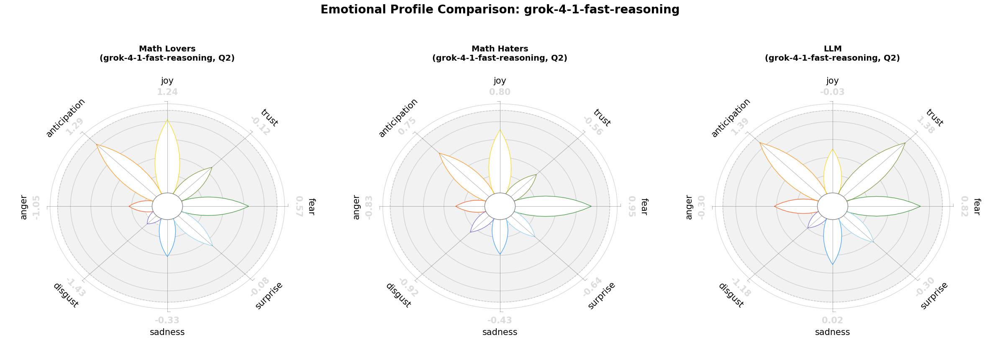

In [41]:
import matplotlib.pyplot as plt
import shapely.geometry as sg
from typing import Optional
from pathlib import Path

# We bypass pyplutchik entirely and pull the engine straight from emoatlas
import emoatlas.emotions as emo_draw 

def plot_final_plutchik_comparison_triple(fav_df, hat_df, llm_df, target_model: str, target_question, out_dir: Optional[Path] = None):
    # 1. Isolate the data
    # Note: Human DFs use 'model_name_x' due to previous merges, LLM uses 'model_name'
    fav_row = fav_df[(fav_df['model_name_x'] == target_model) & (fav_df['question_number'] == target_question)]
    hat_row = hat_df[(hat_df['model_name_x'] == target_model) & (hat_df['question_number'] == target_question)]
    llm_row = llm_df[(llm_df['model_name'] == target_model) & (llm_df['question_number'] == target_question)]
    
    if fav_row.empty or hat_row.empty or llm_row.empty:
        return print(f"Data missing for {target_model} Q{target_question}!")

    emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust']
    fav_scores = {emo: fav_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}
    hat_scores = {emo: hat_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}
    llm_scores = {emo: llm_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}

    # 2. Sync the scale (Universal Z-score bounds across all THREE dataframes)
    all_vals = list(fav_scores.values()) + list(hat_scores.values()) + list(llm_scores.values())
    abs_limit = max(abs(min(all_vals)), abs(max(all_vals))) + 0.5
    unified_rescale = (-abs_limit, abs_limit)
    
    # 95% confidence interval
    reject = (-1.645, 1.645)

    # 3. Create the Side-by-Side Plot (Now 1x3)
    fig, axes = plt.subplots(1, 3, figsize=(24, 8))

    # Custom drawer using the emoatlas engine
    def draw_flower_via_emoatlas(ax, scores):
        # A. Draw the grey statistical rejection region (-1.64 to 1.64)
        mmin = (reject[0] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        mmax = (reject[1] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        
        # Shade the non-significant zone
        reject_circle = sg.Point(0, 0).buffer(mmax)
        ax.add_patch(emo_draw.PolygonPatch(reject_circle, fc="grey", ec=(0.5, 0.5, 0.5, 0.3), alpha=0.1, zorder=-2))
        ax.add_artist(plt.Circle((0, 0), mmax, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))
        
        # Keep the very center white
        inner_white = sg.Point(0, 0).buffer(mmin)
        ax.add_patch(emo_draw.PolygonPatch(inner_white, fc="white", ec=(0.5, 0.5, 0.5, 0), zorder=-1))
        ax.add_artist(plt.Circle((0, 0), mmin, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))

        # B. Draw the background concentric coordinate rings
        for i in range(0, 110, 20):
            ax.add_artist(plt.Circle((0, 0), 0.15 + i / 100, color="grey", alpha=0.3, fill=False, zorder=-20))
            
        # C. Draw the Petals using the internal emoatlas math
        for emo in emotions:
            emo_draw._draw_emotion_petal(
                ax=ax,
                emotion_score=scores[emo],
                emotion=emo,
                font="sans-serif",
                fontweight="light",
                fontsize=15,
                highlight="all",
                show_intensity_levels="none",
                show_coordinates=True,
                height_width_ratio=1,
                reject_range=reject,
                rescale=unified_rescale
            )
            
        # D. Draw inner white circle to cleanly cover the base of the petals
        center_circle = sg.Point(0, 0).buffer(0.15)
        ax.add_patch(emo_draw.PolygonPatch(center_circle, fc="white", ec=(0.5, 0.5, 0.5, 0.3), alpha=1, zorder=15))

        # E. Frame it up
        ax.set_xlim(-1.6, 1.6)
        ax.set_ylim(-1.6, 1.6)
        ax.axis("off")

    # Plot Math Lovers (Left)
    draw_flower_via_emoatlas(axes[0], fav_scores)
    axes[0].set_title(f"Math Lovers\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Plot Math Haters (Middle)
    draw_flower_via_emoatlas(axes[1], hat_scores)
    axes[1].set_title(f"Math Haters\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Plot LLM (Right)
    draw_flower_via_emoatlas(axes[2], llm_scores)
    axes[2].set_title(f"LLM\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Super title
    plt.suptitle(f"Emotional Profile Comparison: {target_model[:25]}", fontsize=20, y=1.05, fontweight="bold")
    plt.tight_layout()
    
    if not out_dir:
        plt.show()
    else:
        san_model = target_model.replace("/", "-")
        plt.savefig(out_dir.joinpath(f"{san_model}_Q{target_question}_Triple.png"), bbox_inches='tight')

# --- RUN IT ---
# Make sure to pass your aggregated llm_df as well!
plot_final_plutchik_comparison_triple(fav_df_agg, hat_df_agg, llm_df_agg, "grok-4-1-fast-reasoning", 2)

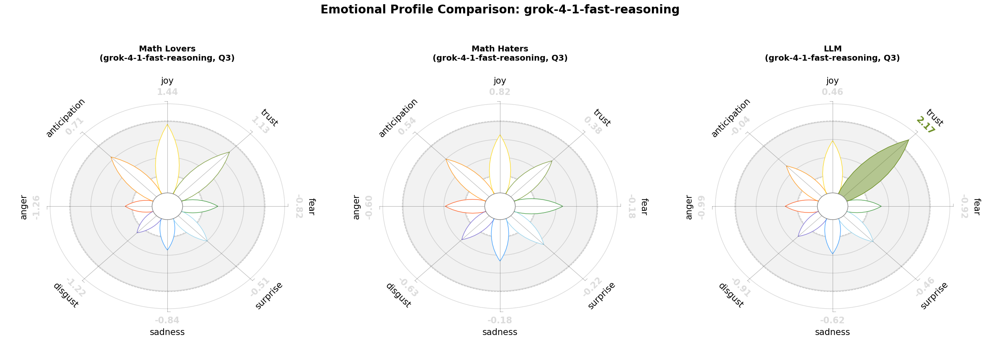

In [42]:
import matplotlib.pyplot as plt
import shapely.geometry as sg
from typing import Optional
from pathlib import Path

# We bypass pyplutchik entirely and pull the engine straight from emoatlas
import emoatlas.emotions as emo_draw 

def plot_final_plutchik_comparison_triple(fav_df, hat_df, llm_df, target_model: str, target_question, out_dir: Optional[Path] = None):
    # 1. Isolate the data
    # Note: Human DFs use 'model_name_x' due to previous merges, LLM uses 'model_name'
    fav_row = fav_df[(fav_df['model_name_x'] == target_model) & (fav_df['question_number'] == target_question)]
    hat_row = hat_df[(hat_df['model_name_x'] == target_model) & (hat_df['question_number'] == target_question)]
    llm_row = llm_df[(llm_df['model_name'] == target_model) & (llm_df['question_number'] == target_question)]
    
    if fav_row.empty or hat_row.empty or llm_row.empty:
        return print(f"Data missing for {target_model} Q{target_question}!")

    emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust']
    fav_scores = {emo: fav_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}
    hat_scores = {emo: hat_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}
    llm_scores = {emo: llm_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}

    # 2. Sync the scale (Universal Z-score bounds across all THREE dataframes)
    all_vals = list(fav_scores.values()) + list(hat_scores.values()) + list(llm_scores.values())
    abs_limit = max(abs(min(all_vals)), abs(max(all_vals))) + 0.5
    unified_rescale = (-abs_limit, abs_limit)
    
    # 95% confidence interval
    reject = (-1.645, 1.645)

    # 3. Create the Side-by-Side Plot (Now 1x3)
    fig, axes = plt.subplots(1, 3, figsize=(24, 8))

    # Custom drawer using the emoatlas engine
    def draw_flower_via_emoatlas(ax, scores):
        # A. Draw the grey statistical rejection region (-1.64 to 1.64)
        mmin = (reject[0] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        mmax = (reject[1] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        
        # Shade the non-significant zone
        reject_circle = sg.Point(0, 0).buffer(mmax)
        ax.add_patch(emo_draw.PolygonPatch(reject_circle, fc="grey", ec=(0.5, 0.5, 0.5, 0.3), alpha=0.1, zorder=-2))
        ax.add_artist(plt.Circle((0, 0), mmax, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))
        
        # Keep the very center white
        inner_white = sg.Point(0, 0).buffer(mmin)
        ax.add_patch(emo_draw.PolygonPatch(inner_white, fc="white", ec=(0.5, 0.5, 0.5, 0), zorder=-1))
        ax.add_artist(plt.Circle((0, 0), mmin, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))

        # B. Draw the background concentric coordinate rings
        for i in range(0, 110, 20):
            ax.add_artist(plt.Circle((0, 0), 0.15 + i / 100, color="grey", alpha=0.3, fill=False, zorder=-20))
            
        # C. Draw the Petals using the internal emoatlas math
        for emo in emotions:
            emo_draw._draw_emotion_petal(
                ax=ax,
                emotion_score=scores[emo],
                emotion=emo,
                font="sans-serif",
                fontweight="light",
                fontsize=15,
                highlight="all",
                show_intensity_levels="none",
                show_coordinates=True,
                height_width_ratio=1,
                reject_range=reject,
                rescale=unified_rescale
            )
            
        # D. Draw inner white circle to cleanly cover the base of the petals
        center_circle = sg.Point(0, 0).buffer(0.15)
        ax.add_patch(emo_draw.PolygonPatch(center_circle, fc="white", ec=(0.5, 0.5, 0.5, 0.3), alpha=1, zorder=15))

        # E. Frame it up
        ax.set_xlim(-1.6, 1.6)
        ax.set_ylim(-1.6, 1.6)
        ax.axis("off")

    # Plot Math Lovers (Left)
    draw_flower_via_emoatlas(axes[0], fav_scores)
    axes[0].set_title(f"Math Lovers\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Plot Math Haters (Middle)
    draw_flower_via_emoatlas(axes[1], hat_scores)
    axes[1].set_title(f"Math Haters\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Plot LLM (Right)
    draw_flower_via_emoatlas(axes[2], llm_scores)
    axes[2].set_title(f"LLM\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Super title
    plt.suptitle(f"Emotional Profile Comparison: {target_model[:25]}", fontsize=20, y=1.05, fontweight="bold")
    plt.tight_layout()
    
    if not out_dir:
        plt.show()
    else:
        san_model = target_model.replace("/", "-")
        plt.savefig(out_dir.joinpath(f"{san_model}_Q{target_question}_Triple.png"), bbox_inches='tight')

# --- RUN IT ---
# Make sure to pass your aggregated llm_df as well!
plot_final_plutchik_comparison_triple(fav_df_agg, hat_df_agg, llm_df_agg, "grok-4-1-fast-reasoning", 3)

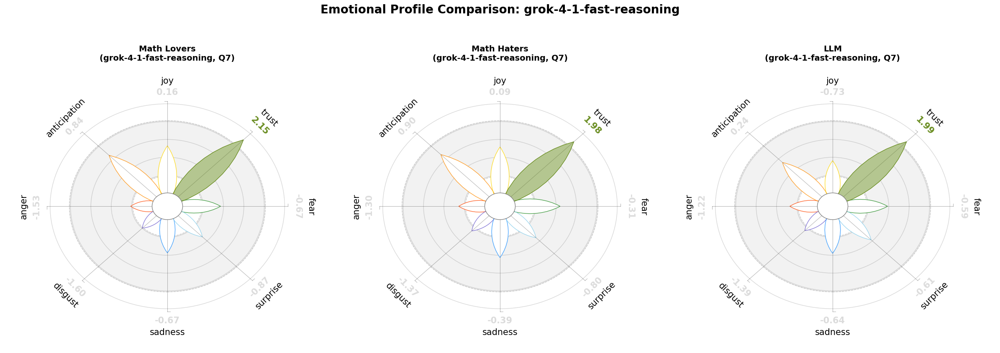

In [43]:
import matplotlib.pyplot as plt
import shapely.geometry as sg
from typing import Optional
from pathlib import Path

# We bypass pyplutchik entirely and pull the engine straight from emoatlas
import emoatlas.emotions as emo_draw 

def plot_final_plutchik_comparison_triple(fav_df, hat_df, llm_df, target_model: str, target_question, out_dir: Optional[Path] = None):
    # 1. Isolate the data
    # Note: Human DFs use 'model_name_x' due to previous merges, LLM uses 'model_name'
    fav_row = fav_df[(fav_df['model_name_x'] == target_model) & (fav_df['question_number'] == target_question)]
    hat_row = hat_df[(hat_df['model_name_x'] == target_model) & (hat_df['question_number'] == target_question)]
    llm_row = llm_df[(llm_df['model_name'] == target_model) & (llm_df['question_number'] == target_question)]
    
    if fav_row.empty or hat_row.empty or llm_row.empty:
        return print(f"Data missing for {target_model} Q{target_question}!")

    emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust']
    fav_scores = {emo: fav_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}
    hat_scores = {emo: hat_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}
    llm_scores = {emo: llm_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}

    # 2. Sync the scale (Universal Z-score bounds across all THREE dataframes)
    all_vals = list(fav_scores.values()) + list(hat_scores.values()) + list(llm_scores.values())
    abs_limit = max(abs(min(all_vals)), abs(max(all_vals))) + 0.5
    unified_rescale = (-abs_limit, abs_limit)
    
    # 95% confidence interval
    reject = (-1.645, 1.645)

    # 3. Create the Side-by-Side Plot (Now 1x3)
    fig, axes = plt.subplots(1, 3, figsize=(24, 8))

    # Custom drawer using the emoatlas engine
    def draw_flower_via_emoatlas(ax, scores):
        # A. Draw the grey statistical rejection region (-1.64 to 1.64)
        mmin = (reject[0] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        mmax = (reject[1] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        
        # Shade the non-significant zone
        reject_circle = sg.Point(0, 0).buffer(mmax)
        ax.add_patch(emo_draw.PolygonPatch(reject_circle, fc="grey", ec=(0.5, 0.5, 0.5, 0.3), alpha=0.1, zorder=-2))
        ax.add_artist(plt.Circle((0, 0), mmax, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))
        
        # Keep the very center white
        inner_white = sg.Point(0, 0).buffer(mmin)
        ax.add_patch(emo_draw.PolygonPatch(inner_white, fc="white", ec=(0.5, 0.5, 0.5, 0), zorder=-1))
        ax.add_artist(plt.Circle((0, 0), mmin, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))

        # B. Draw the background concentric coordinate rings
        for i in range(0, 110, 20):
            ax.add_artist(plt.Circle((0, 0), 0.15 + i / 100, color="grey", alpha=0.3, fill=False, zorder=-20))
            
        # C. Draw the Petals using the internal emoatlas math
        for emo in emotions:
            emo_draw._draw_emotion_petal(
                ax=ax,
                emotion_score=scores[emo],
                emotion=emo,
                font="sans-serif",
                fontweight="light",
                fontsize=15,
                highlight="all",
                show_intensity_levels="none",
                show_coordinates=True,
                height_width_ratio=1,
                reject_range=reject,
                rescale=unified_rescale
            )
            
        # D. Draw inner white circle to cleanly cover the base of the petals
        center_circle = sg.Point(0, 0).buffer(0.15)
        ax.add_patch(emo_draw.PolygonPatch(center_circle, fc="white", ec=(0.5, 0.5, 0.5, 0.3), alpha=1, zorder=15))

        # E. Frame it up
        ax.set_xlim(-1.6, 1.6)
        ax.set_ylim(-1.6, 1.6)
        ax.axis("off")

    # Plot Math Lovers (Left)
    draw_flower_via_emoatlas(axes[0], fav_scores)
    axes[0].set_title(f"Math Lovers\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Plot Math Haters (Middle)
    draw_flower_via_emoatlas(axes[1], hat_scores)
    axes[1].set_title(f"Math Haters\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Plot LLM (Right)
    draw_flower_via_emoatlas(axes[2], llm_scores)
    axes[2].set_title(f"LLM\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Super title
    plt.suptitle(f"Emotional Profile Comparison: {target_model[:25]}", fontsize=20, y=1.05, fontweight="bold")
    plt.tight_layout()
    
    if not out_dir:
        plt.show()
    else:
        san_model = target_model.replace("/", "-")
        plt.savefig(out_dir.joinpath(f"{san_model}_Q{target_question}_Triple.png"), bbox_inches='tight')

# --- RUN IT ---
# Make sure to pass your aggregated llm_df as well!
plot_final_plutchik_comparison_triple(fav_df_agg, hat_df_agg, llm_df_agg, "grok-4-1-fast-reasoning", 7)

## Mistral Small 3.2

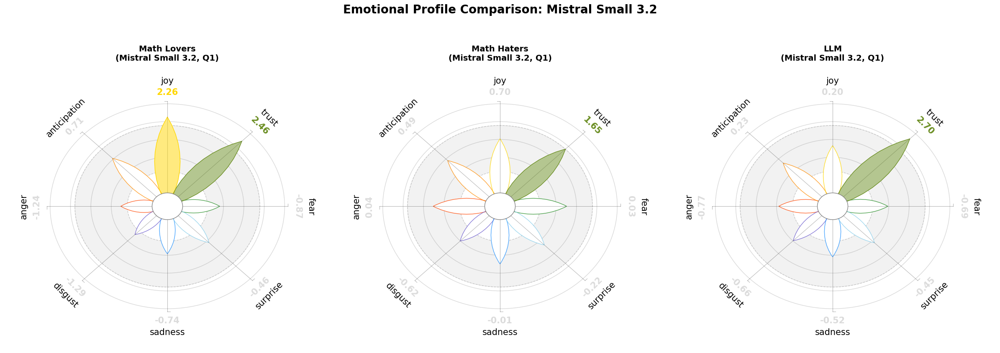

In [44]:
import matplotlib.pyplot as plt
import shapely.geometry as sg
from typing import Optional
from pathlib import Path

# We bypass pyplutchik entirely and pull the engine straight from emoatlas
import emoatlas.emotions as emo_draw 

def plot_final_plutchik_comparison_triple(fav_df, hat_df, llm_df, target_model: str, target_question, out_dir: Optional[Path] = None):
    # 1. Isolate the data
    # Note: Human DFs use 'model_name_x' due to previous merges, LLM uses 'model_name'
    fav_row = fav_df[(fav_df['model_name_x'] == target_model) & (fav_df['question_number'] == target_question)]
    hat_row = hat_df[(hat_df['model_name_x'] == target_model) & (hat_df['question_number'] == target_question)]
    llm_row = llm_df[(llm_df['model_name'] == target_model) & (llm_df['question_number'] == target_question)]
    
    if fav_row.empty or hat_row.empty or llm_row.empty:
        return print(f"Data missing for {target_model} Q{target_question}!")

    emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust']
    fav_scores = {emo: fav_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}
    hat_scores = {emo: hat_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}
    llm_scores = {emo: llm_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}

    # 2. Sync the scale (Universal Z-score bounds across all THREE dataframes)
    all_vals = list(fav_scores.values()) + list(hat_scores.values()) + list(llm_scores.values())
    abs_limit = max(abs(min(all_vals)), abs(max(all_vals))) + 0.5
    unified_rescale = (-abs_limit, abs_limit)
    
    # 95% confidence interval
    reject = (-1.645, 1.645)

    # 3. Create the Side-by-Side Plot (Now 1x3)
    fig, axes = plt.subplots(1, 3, figsize=(24, 8))

    # Custom drawer using the emoatlas engine
    def draw_flower_via_emoatlas(ax, scores):
        # A. Draw the grey statistical rejection region (-1.64 to 1.64)
        mmin = (reject[0] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        mmax = (reject[1] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        
        # Shade the non-significant zone
        reject_circle = sg.Point(0, 0).buffer(mmax)
        ax.add_patch(emo_draw.PolygonPatch(reject_circle, fc="grey", ec=(0.5, 0.5, 0.5, 0.3), alpha=0.1, zorder=-2))
        ax.add_artist(plt.Circle((0, 0), mmax, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))
        
        # Keep the very center white
        inner_white = sg.Point(0, 0).buffer(mmin)
        ax.add_patch(emo_draw.PolygonPatch(inner_white, fc="white", ec=(0.5, 0.5, 0.5, 0), zorder=-1))
        ax.add_artist(plt.Circle((0, 0), mmin, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))

        # B. Draw the background concentric coordinate rings
        for i in range(0, 110, 20):
            ax.add_artist(plt.Circle((0, 0), 0.15 + i / 100, color="grey", alpha=0.3, fill=False, zorder=-20))
            
        # C. Draw the Petals using the internal emoatlas math
        for emo in emotions:
            emo_draw._draw_emotion_petal(
                ax=ax,
                emotion_score=scores[emo],
                emotion=emo,
                font="sans-serif",
                fontweight="light",
                fontsize=15,
                highlight="all",
                show_intensity_levels="none",
                show_coordinates=True,
                height_width_ratio=1,
                reject_range=reject,
                rescale=unified_rescale
            )
            
        # D. Draw inner white circle to cleanly cover the base of the petals
        center_circle = sg.Point(0, 0).buffer(0.15)
        ax.add_patch(emo_draw.PolygonPatch(center_circle, fc="white", ec=(0.5, 0.5, 0.5, 0.3), alpha=1, zorder=15))

        # E. Frame it up
        ax.set_xlim(-1.6, 1.6)
        ax.set_ylim(-1.6, 1.6)
        ax.axis("off")

    # Plot Math Lovers (Left)
    draw_flower_via_emoatlas(axes[0], fav_scores)
    axes[0].set_title(f"Math Lovers\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Plot Math Haters (Middle)
    draw_flower_via_emoatlas(axes[1], hat_scores)
    axes[1].set_title(f"Math Haters\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Plot LLM (Right)
    draw_flower_via_emoatlas(axes[2], llm_scores)
    axes[2].set_title(f"LLM\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Super title
    plt.suptitle(f"Emotional Profile Comparison: {target_model[:25]}", fontsize=20, y=1.05, fontweight="bold")
    plt.tight_layout()
    
    if not out_dir:
        plt.show()
    else:
        san_model = target_model.replace("/", "-")
        plt.savefig(out_dir.joinpath(f"{san_model}_Q{target_question}_Triple.png"), bbox_inches='tight')

# --- RUN IT ---
# Make sure to pass your aggregated llm_df as well!
plot_final_plutchik_comparison_triple(fav_df_agg, hat_df_agg, llm_df_agg, "Mistral Small 3.2", 1)

# Comparison Human Math Lovers vs Human Math Haters vs LLm (AGGREGATED QUESTIOSN 1-2-3-7)

## Mistral Small 3.2

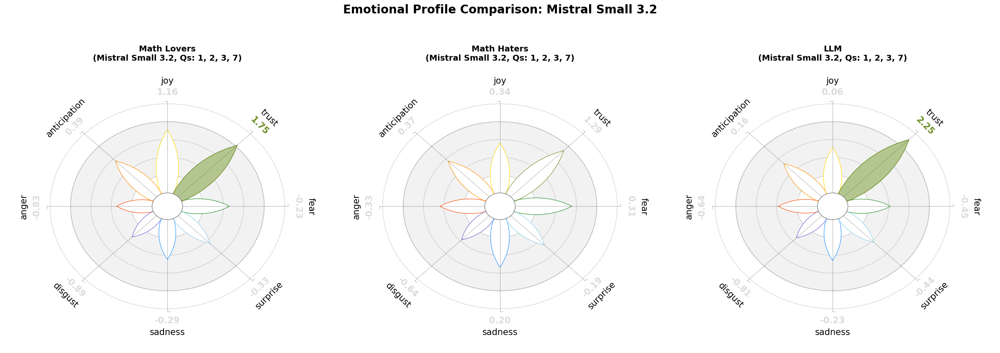

In [45]:
import matplotlib.pyplot as plt
import shapely.geometry as sg
from typing import Optional, List
from pathlib import Path

# We bypass pyplutchik entirely and pull the engine straight from emoatlas
import emoatlas.emotions as emo_draw 

def plot_final_plutchik_comparison_triple2(fav_df, hat_df, llm_df, target_model: str, target_questions: List[int], out_dir: Optional[Path] = None):
    # 1. Isolate the data
    # Note: Human DFs use 'model_name_x' due to previous merges, LLM uses 'model_name'
    # Changed from == to .isin() to accept a list of questions
    fav_rows = fav_df[(fav_df['model_name_x'] == target_model) & (fav_df['question_number'].isin(target_questions))]
    hat_rows = hat_df[(hat_df['model_name_x'] == target_model) & (hat_df['question_number'].isin(target_questions))]
    llm_rows = llm_df[(llm_df['model_name'] == target_model) & (llm_df['question_number'].isin(target_questions))]
    
    if fav_rows.empty or hat_rows.empty or llm_rows.empty:
        return print(f"Data missing for {target_model} Qs: {target_questions}!")

    emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust']
    
    # Calculate the mean of the z-scores across all questions in the list for each emotion
    fav_scores = {emo: fav_rows[f'z_scores_{emo}'].mean() for emo in emotions}
    hat_scores = {emo: hat_rows[f'z_scores_{emo}'].mean() for emo in emotions}
    llm_scores = {emo: llm_rows[f'z_scores_{emo}'].mean() for emo in emotions}

    # 2. Sync the scale (Universal Z-score bounds across all THREE dataframes)
    all_vals = list(fav_scores.values()) + list(hat_scores.values()) + list(llm_scores.values())
    abs_limit = max(abs(min(all_vals)), abs(max(all_vals))) + 0.5
    unified_rescale = (-abs_limit, abs_limit)
    
    # 95% confidence interval
    reject = (-1.645, 1.645)

    # String representations for multiple questions in titles and filenames
    q_title_str = ", ".join(map(str, target_questions))
    q_file_str = "_".join(map(str, target_questions))

    # 3. Create the Side-by-Side Plot (Now 1x3)
    fig, axes = plt.subplots(1, 3, figsize=(24, 8))

    # Custom drawer using the emoatlas engine
    def draw_flower_via_emoatlas(ax, scores):
        # A. Draw the grey statistical rejection region (-1.64 to 1.64)
        mmin = (reject[0] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        mmax = (reject[1] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        
        # Shade the non-significant zone
        reject_circle = sg.Point(0, 0).buffer(mmax)
        ax.add_patch(emo_draw.PolygonPatch(reject_circle, fc="grey", ec=(0.5, 0.5, 0.5, 0.3), alpha=0.1, zorder=-2))
        ax.add_artist(plt.Circle((0, 0), mmax, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))
        
        # Keep the very center white
        inner_white = sg.Point(0, 0).buffer(mmin)
        ax.add_patch(emo_draw.PolygonPatch(inner_white, fc="white", ec=(0.5, 0.5, 0.5, 0), zorder=-1))
        ax.add_artist(plt.Circle((0, 0), mmin, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))

        # B. Draw the background concentric coordinate rings
        for i in range(0, 110, 20):
            ax.add_artist(plt.Circle((0, 0), 0.15 + i / 100, color="grey", alpha=0.3, fill=False, zorder=-20))
            
        # C. Draw the Petals using the internal emoatlas math
        for emo in emotions:
            emo_draw._draw_emotion_petal(
                ax=ax,
                emotion_score=scores[emo],
                emotion=emo,
                font="sans-serif",
                fontweight="light",
                fontsize=15,
                highlight="all",
                show_intensity_levels="none",
                show_coordinates=True,
                height_width_ratio=1,
                reject_range=reject,
                rescale=unified_rescale
            )
            
        # D. Draw inner white circle to cleanly cover the base of the petals
        center_circle = sg.Point(0, 0).buffer(0.15)
        ax.add_patch(emo_draw.PolygonPatch(center_circle, fc="white", ec=(0.5, 0.5, 0.5, 0.3), alpha=1, zorder=15))

        # E. Frame it up
        ax.set_xlim(-1.6, 1.6)
        ax.set_ylim(-1.6, 1.6)
        ax.axis("off")

    # Plot Math Lovers (Left)
    draw_flower_via_emoatlas(axes[0], fav_scores)
    axes[0].set_title(f"Math Lovers\n({target_model}, Qs: {q_title_str})", fontsize=14, fontweight="bold")

    # Plot Math Haters (Middle)
    draw_flower_via_emoatlas(axes[1], hat_scores)
    axes[1].set_title(f"Math Haters\n({target_model}, Qs: {q_title_str})", fontsize=14, fontweight="bold")

    # Plot LLM (Right)
    draw_flower_via_emoatlas(axes[2], llm_scores)
    axes[2].set_title(f"LLM\n({target_model}, Qs: {q_title_str})", fontsize=14, fontweight="bold")

    # Super title
    plt.suptitle(f"Emotional Profile Comparison: {target_model[:25]}", fontsize=20, y=1.05, fontweight="bold")
    plt.tight_layout()
    
    if not out_dir:
        plt.show()
    else:
        san_model = target_model.replace("/", "-")
        plt.savefig(out_dir.joinpath(f"{san_model}_Qs_{q_file_str}_Triple.png"), bbox_inches='tight')

# --- RUN IT ---
# Pass a list of integers instead of a single integer
plot_final_plutchik_comparison_triple2(fav_df_agg, hat_df_agg, llm_df_agg, "Mistral Small 3.2", [1, 2, 3, 7])

In [46]:
import matplotlib.pyplot as plt
import shapely.geometry as sg
from typing import Optional, List
from pathlib import Path

# We bypass pyplutchik entirely and pull the engine straight from emoatlas
import emoatlas.emotions as emo_draw 

def plot_final_plutchik_comparison_triple(fav_df, hat_df, llm_df, target_model: str, target_questions: List[int], out_dir: Optional[Path] = None):
    # 1. Isolate the data
    fav_rows = fav_df[(fav_df['model_name_x'] == target_model) & (fav_df['question_number'].isin(target_questions))]
    hat_rows = hat_df[(hat_df['model_name_x'] == target_model) & (hat_df['question_number'].isin(target_questions))]
    llm_rows = llm_df[(llm_df['model_name'] == target_model) & (llm_df['question_number'].isin(target_questions))]
    
    if fav_rows.empty or hat_rows.empty or llm_rows.empty:
        print(f"Data missing for {target_model} Qs: {target_questions}! Skipping...")
        return

    emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust']
    
    # Calculate the mean of the z-scores across all questions in the list for each emotion
    fav_scores = {emo: fav_rows[f'z_scores_{emo}'].mean() for emo in emotions}
    hat_scores = {emo: hat_rows[f'z_scores_{emo}'].mean() for emo in emotions}
    llm_scores = {emo: llm_rows[f'z_scores_{emo}'].mean() for emo in emotions}

    # 2. Sync the scale (Universal Z-score bounds across all THREE dataframes)
    all_vals = list(fav_scores.values()) + list(hat_scores.values()) + list(llm_scores.values())
    abs_limit = max(abs(min(all_vals)), abs(max(all_vals))) + 0.5
    unified_rescale = (-abs_limit, abs_limit)
    
    # 95% confidence interval
    reject = (-1.645, 1.645)

    # String representations for multiple questions in titles and filenames
    q_title_str = ", ".join(map(str, target_questions))
    q_file_str = "_".join(map(str, target_questions))

    # 3. Create the Side-by-Side Plot (Now 1x3)
    fig, axes = plt.subplots(1, 3, figsize=(24, 8))

    # Custom drawer using the emoatlas engine
    def draw_flower_via_emoatlas(ax, scores):
        # A. Draw the grey statistical rejection region (-1.64 to 1.64)
        mmin = (reject[0] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        mmax = (reject[1] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        
        # Shade the non-significant zone
        reject_circle = sg.Point(0, 0).buffer(mmax)
        ax.add_patch(emo_draw.PolygonPatch(reject_circle, fc="grey", ec=(0.5, 0.5, 0.5, 0.3), alpha=0.1, zorder=-2))
        ax.add_artist(plt.Circle((0, 0), mmax, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))
        
        # Keep the very center white
        inner_white = sg.Point(0, 0).buffer(mmin)
        ax.add_patch(emo_draw.PolygonPatch(inner_white, fc="white", ec=(0.5, 0.5, 0.5, 0), zorder=-1))
        ax.add_artist(plt.Circle((0, 0), mmin, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))

        # B. Draw the background concentric coordinate rings
        for i in range(0, 110, 20):
            ax.add_artist(plt.Circle((0, 0), 0.15 + i / 100, color="grey", alpha=0.3, fill=False, zorder=-20))
            
        # C. Draw the Petals using the internal emoatlas math
        for emo in emotions:
            emo_draw._draw_emotion_petal(
                ax=ax,
                emotion_score=scores[emo],
                emotion=emo,
                font="sans-serif",
                fontweight="light",
                fontsize=15,
                highlight="all",
                show_intensity_levels="none",
                show_coordinates=True,
                height_width_ratio=1,
                reject_range=reject,
                rescale=unified_rescale
            )
            
        # D. Draw inner white circle to cleanly cover the base of the petals
        center_circle = sg.Point(0, 0).buffer(0.15)
        ax.add_patch(emo_draw.PolygonPatch(center_circle, fc="white", ec=(0.5, 0.5, 0.5, 0.3), alpha=1, zorder=15))

        # E. Frame it up
        ax.set_xlim(-1.6, 1.6)
        ax.set_ylim(-1.6, 1.6)
        ax.axis("off")

    # Plot Math Lovers (Left)
    draw_flower_via_emoatlas(axes[0], fav_scores)
    axes[0].set_title(f"Math Lovers\n({target_model}, Qs: {q_title_str})", fontsize=14, fontweight="bold")

    # Plot Math Haters (Middle)
    draw_flower_via_emoatlas(axes[1], hat_scores)
    axes[1].set_title(f"Math Haters\n({target_model}, Qs: {q_title_str})", fontsize=14, fontweight="bold")

    # Plot LLM (Right)
    draw_flower_via_emoatlas(axes[2], llm_scores)
    axes[2].set_title(f"LLM\n({target_model}, Qs: {q_title_str})", fontsize=14, fontweight="bold")

    # Super title
    plt.suptitle(f"Emotional Profile Comparison: {target_model[:25]}", fontsize=20, y=1.05, fontweight="bold")
    plt.tight_layout()
    
    if not out_dir:
        plt.show()
    else:
        san_model = target_model.replace("/", "-")
        # Updated to dynamically save as SVG with your requested parameters
        svg_filename = f"{san_model}_Qs_{q_file_str}_Triple.svg"
        save_path = out_dir.joinpath(svg_filename)
        plt.savefig(save_path, dpi=300, format="svg", bbox_inches='tight')
        
    # Crucial when looping: close the figure to free up memory
    plt.close(fig) 


# --- RUN IT FOR ALL 14 MODELS ---

# 1. Update this list with your exact 14 model names
all_models = [          'Mistral Small 4',             'DeepSeek Chat',
   'grok-4-1-fast-reasoning',       'Qwen3 4B (Thinking)',
              'Ministral 3B',         'Mistral Small 3.2',
    'Anita 24B (Uncensored)',     'Qwen3 4B (Uncensored)',
            'Granite 4 Tiny',                'Qwen3.5 9B',
                  'Qwen3 4B', 'Ministral 14B (Reasoning)',
        'Phi-4 (Reasoning+)',           'Magistral Small']

# 2. Define the target questions
target_qs = [1, 2, 3, 7]

# 3. Create the visualizations output directory
output_folder = Path("./visualizations")
output_folder.mkdir(parents=True, exist_ok=True)

# 4. Iterate through the models
for model in all_models:
    print(f"Generating SVG for: {model}...")
    plot_final_plutchik_comparison_triple(
        fav_df=fav_df_agg, 
        hat_df=hat_df_agg, 
        llm_df=llm_df_agg, 
        target_model=model, 
        target_questions=target_qs,
        out_dir=output_folder
    )

print(f"Done! Check the '{output_folder}' directory for your 14 SVG files.")

Generating SVG for: Mistral Small 4...
Generating SVG for: DeepSeek Chat...
Generating SVG for: grok-4-1-fast-reasoning...
Generating SVG for: Qwen3 4B (Thinking)...
Generating SVG for: Ministral 3B...
Generating SVG for: Mistral Small 3.2...
Generating SVG for: Anita 24B (Uncensored)...
Generating SVG for: Qwen3 4B (Uncensored)...
Generating SVG for: Granite 4 Tiny...
Generating SVG for: Qwen3.5 9B...
Generating SVG for: Qwen3 4B...
Generating SVG for: Ministral 14B (Reasoning)...
Generating SVG for: Phi-4 (Reasoning+)...
Generating SVG for: Magistral Small...
Done! Check the 'visualizations' directory for your 14 SVG files.


In [47]:
# Set this to True to save images
if False:
    from pathlib import Path

    flower_dir = Path("./emotional_flowers")
    for model in fav_df_agg["model_name_x"].unique():
        for question in QUESTIONS_TO_CONSIDER:
            plot_final_plutchik_comparison(fav_df_agg, hat_df_agg, model, question, flower_dir)

# Visualizations

In [48]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your dataframe is named 'df'
# 1. Identify your z-score columns
z_score_cols = [col for col in df.columns if col.startswith('z_scores_')]

# 2. Melt the dataframe into a long format
df_long = df.melt(
    id_vars=['model_name', 'question_number'],
    value_vars=z_score_cols,
    var_name='emotion',
    value_name='z_score'
)

# 3. Clean up the emotion column names for prettier plot labels
df_long['emotion'] = df_long['emotion'].str.replace('z_scores_', '').str.capitalize()

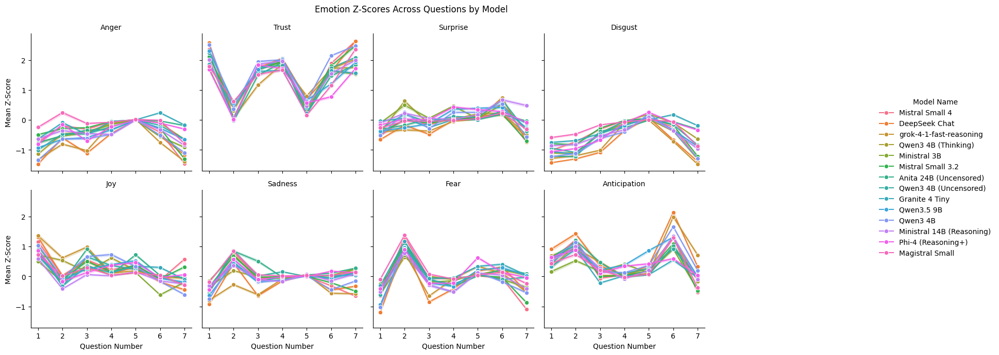

In [49]:
# Create a grid of plots, one for each emotion
g = sns.FacetGrid(df_long, col="emotion", col_wrap=4, height=3.5, sharey=True)

# Map a lineplot to each grid, showing question_number vs z_score, colored by model
g.map_dataframe(sns.lineplot, x="question_number", y="z_score", hue="model_name", marker="o")

# Add a single legend outside the grid
g.add_legend(title="Model Name", bbox_to_anchor=(1.05, 0.5), loc='center left')
g.set_axis_labels("Question Number", "Mean Z-Score")
g.set_titles(col_template="{col_name}")

plt.subplots_adjust(top=0.9)
g.fig.suptitle('Emotion Z-Scores Across Questions by Model')
plt.show()

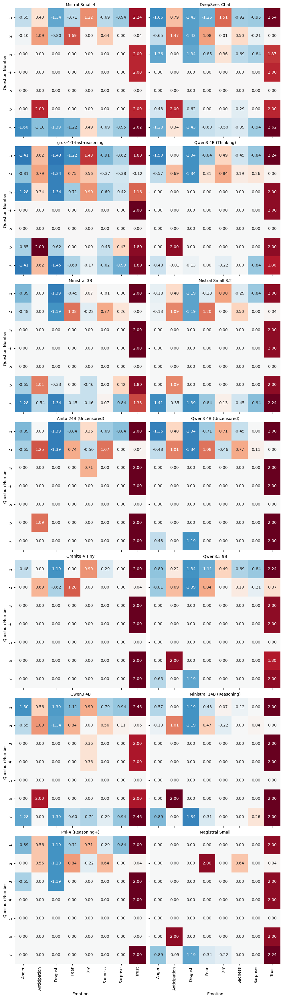

In [50]:
# Create a pivot table suited for a faceted heatmap
def draw_heatmap(*args, **kwargs):
    data = kwargs.pop('data')
    
    # CHANGED: Use pivot_table instead of pivot, and add aggfunc='mean'
    d = data.pivot_table(index=args[1], columns=args[0], values=args[2], aggfunc='median')
    
    sns.heatmap(d, cmap="RdBu_r", center=0, annot=True, fmt=".2f", cbar=False, **kwargs)

g = sns.FacetGrid(df_long, col="model_name", col_wrap=2, height=5, sharex=True, sharey=True)
g.map_dataframe(draw_heatmap, 'emotion', 'question_number', 'z_score')

g.set_axis_labels("Emotion", "Question Number")
g.set_titles(col_template="{col_name}")
plt.show()

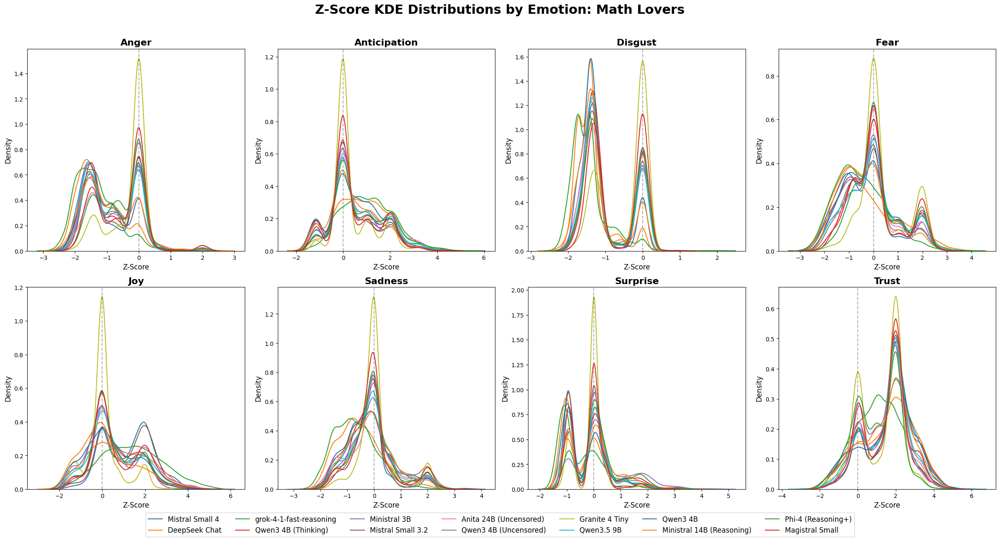

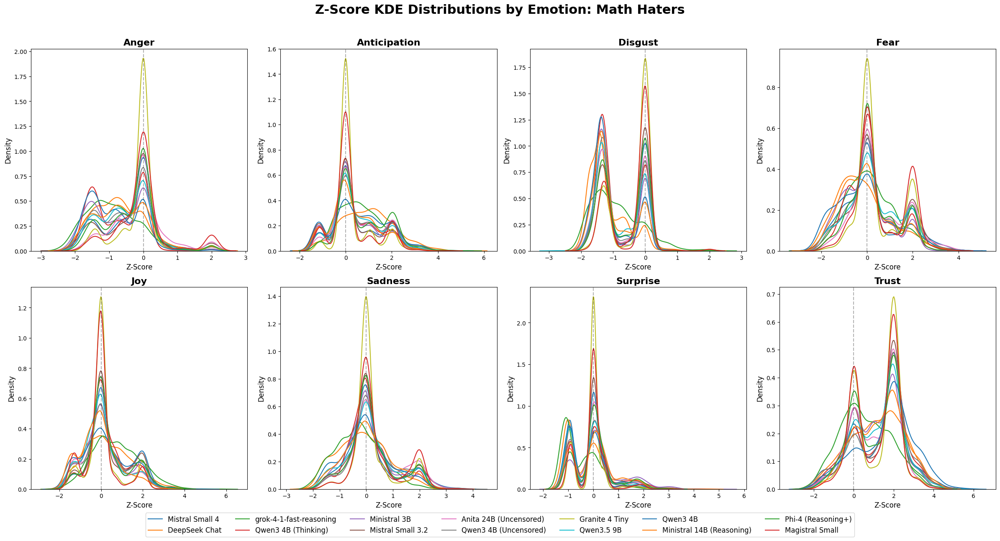

/var/folders/mr/318qq8ns08140x5d2pm9yxh80000gn/T/ipykernel_1584/1432250486.py:40: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
/var/folders/mr/318qq8ns08140x5d2pm9yxh80000gn/T/ipykernel_1584/1432250486.py:40: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
/var/folders/mr/318qq8ns08140x5d2pm9yxh80000gn/T/ipykernel_1584/1432250486.py:40: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
/var/folders/mr/318qq8ns08140x5d2pm9yxh80000gn/T/ipykernel_1584/1432250486.py:40: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
/var/folders/mr/318qq8ns08140x5d2pm9yxh80000gn/T/ipykernel_1584/1432250486.py:40: UserWarning: Dataset has 0 variance; skipping density estimate. Pa

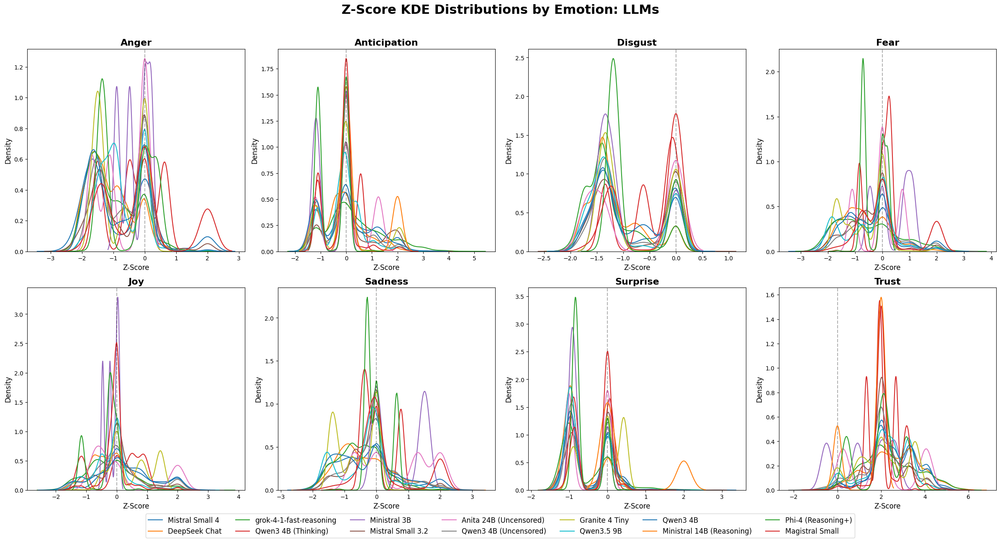

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Optional
from pathlib import Path

def plot_emotion_kde_distributions(fav_df, hat_df, llm_df, out_dir: Optional[Path] = None):
    emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust']
    
    # Define the three groups, their corresponding dataframes, and the correct model column name
    groups = [
        ("Math Lovers", fav_df, "model_name_x"),
        ("Math Haters", hat_df, "model_name_x"),
        ("LLMs", llm_df, "model_name")
    ]
    
    for group_name, df, model_col in groups:
        # Create a 2x4 grid for the 8 emotions
        fig, axes = plt.subplots(2, 4, figsize=(24, 12))
        axes = axes.flatten()
        
        # Get the list of the 14 models in this dataframe
        models = df[model_col].dropna().unique()
        
        for i, emo in enumerate(emotions):
            ax = axes[i]
            score_col = f'z_scores_{emo}'
            
            # Check if column exists to avoid KeyError
            if score_col not in df.columns:
                print(f"Warning: {score_col} not found in {group_name} dataframe.")
                continue

            # Plot a KDE for each model
            for model in models:
                subset = df[df[model_col] == model]
                # Drop NaNs to prevent seaborn from throwing errors on empty/invalid slices
                valid_data = subset[score_col].dropna() 
                
                if not valid_data.empty and len(valid_data) > 1:
                    sns.kdeplot(
                        data=valid_data, 
                        ax=ax, 
                        label=model, 
                        linewidth=1.5,
                        fill=False
                    )
            
            # Clean up subplot titles and labels
            ax.set_title(f"{emo.capitalize()}", fontsize=16, fontweight="bold")
            ax.set_xlabel("Z-Score", fontsize=12)
            ax.set_ylabel("Density", fontsize=12)
            
            # Draw a subtle line at 0 for reference
            ax.axvline(0, color='black', linestyle='--', alpha=0.3)

        # Super title for the whole figure
        plt.suptitle(f"Z-Score KDE Distributions by Emotion: {group_name}", fontsize=22, fontweight="bold", y=1.02)
        plt.tight_layout()
        
        # Extract handles and labels for the master legend from the last axes
        handles, labels = axes[-1].get_legend_handles_labels()
        
        # Place a single master legend below the subplots
        fig.legend(handles, labels, loc='lower center', ncol=7, bbox_to_anchor=(0.5, -0.05), fontsize=12)
        
        if not out_dir:
            plt.show()
        else:
            safe_name = group_name.replace(" ", "_").lower()
            plt.savefig(out_dir.joinpath(f"KDE_Distributions_{safe_name}.png"), bbox_inches='tight')
        
        # Close the figure to free up memory before the next loop
        plt.close(fig)

# --- RUN IT ---
# Make sure seaborn is installed (pip install seaborn)
plot_emotion_kde_distributions(fav_df, hat_df, llm_df)

# TFMN Extracted

# Visualization For Anxiety

In [52]:
df_anxiety_zscore.head()

,model_name_x,run_id,mode_x,question_number,answer_text,z_scores_anger,z_scores_trust,z_scores_surprise,z_scores_disgust,z_scores_joy,...,ocean_extraversion_score,ocean_extraversion_level,ocean_agreeableness_score,ocean_agreeableness_level,ocean_neuroticism_score,ocean_neuroticism_level,amas_score,mseaq_score,anxiety_score,anxiety_level
0,Mistral Small 4,625b014336,human,1,I have a strong affinity for mathematics. It's...,0.000000,2.000000,0.000000,0.000000,2.000000,...,69,high,8,low,73,high,36.0,68.0,104.0,low_anxiety
1,Mistral Small 4,625b014336,human,2,Not really. I find mathematics to be quite cal...,-1.355535,0.414788,0.432592,-1.187540,1.651038,...,69,high,8,low,73,high,36.0,68.0,104.0,low_anxiety
2,Mistral Small 4,625b014336,human,3,"Yes, I've used AI tools like Wolfram Alpha and...",-1.355535,2.244737,-0.839737,-1.187540,2.587355,...,69,high,8,low,73,high,36.0,68.0,104.0,low_anxiety
3,Mistral Small 4,625b014336,human,4,"To solve a second-order algebraic equation, fi...",-1.355535,2.244737,1.704921,-0.130383,1.651038,...,69,high,8,low,73,high,36.0,68.0,104.0,low_anxiety
4,Mistral Small 4,625b014336,human,5,To find the stationary points of a function y ...,0.000000,0.000000,0.000000,0.000000,0.000000,...,69,high,8,low,73,high,36.0,68.0,104.0,low_anxiety


# grok-4-1-fast-reasoning

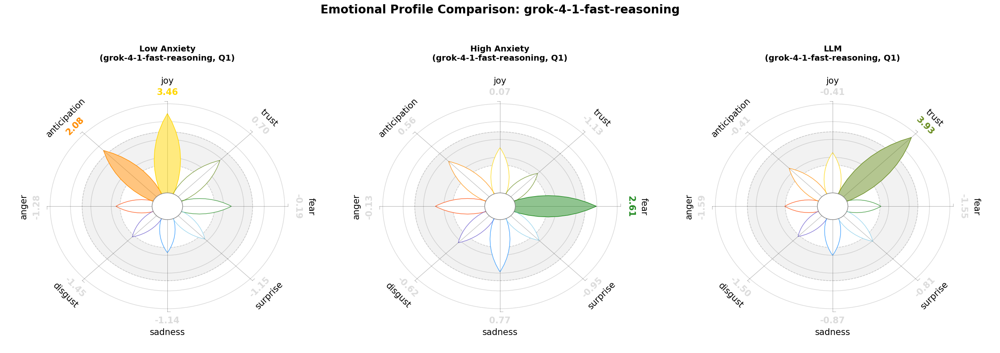

In [53]:
import matplotlib.pyplot as plt
import shapely.geometry as sg
from typing import Optional
from pathlib import Path

# We bypass pyplutchik entirely and pull the engine straight from emoatlas
import emoatlas.emotions as emo_draw 

def plot_final_plutchik_comparison_triple(human_df, llm_df, target_model: str, target_question, out_dir: Optional[Path] = None):
    # 1. Isolate the data
    # Note: Human DFs use 'model_name_x' due to previous merges, LLM uses 'model_name'
    fav_row = human_df[(human_df['model_name_x'] == target_model) & (human_df['question_number'] == target_question) & (human_df['anxiety_level'] == "low_anxiety")]
    hat_row = human_df[(human_df['model_name_x'] == target_model) & (human_df['question_number'] == target_question) & (human_df['anxiety_level'] == "high_anxiety")]
    llm_row = llm_df[(llm_df['model_name'] == target_model) & (llm_df['question_number'] == target_question)]
    
    if fav_row.empty or hat_row.empty or llm_row.empty:
        return print(f"Data missing for {target_model} Q{target_question}!")

    emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust']
    fav_scores = {emo: fav_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}
    hat_scores = {emo: hat_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}
    llm_scores = {emo: llm_row.iloc[0][f'z_scores_{emo}'] for emo in emotions}

    # 2. Sync the scale (Universal Z-score bounds across all THREE dataframes)
    all_vals = list(fav_scores.values()) + list(hat_scores.values()) + list(llm_scores.values())
    abs_limit = max(abs(min(all_vals)), abs(max(all_vals))) + 0.5
    unified_rescale = (-abs_limit, abs_limit)
    
    # 90% confidence interval
    reject = (-1.645, 1.645)

    # 3. Create the Side-by-Side Plot (Now 1x3)
    fig, axes = plt.subplots(1, 3, figsize=(24, 8))

    # Custom drawer using the emoatlas engine
    def draw_flower_via_emoatlas(ax, scores):
        # A. Draw the grey statistical rejection region (-1.64 to 1.64)
        mmin = (reject[0] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        mmax = (reject[1] - unified_rescale[0]) / (unified_rescale[1] - unified_rescale[0]) + 0.15
        
        # Shade the non-significant zone
        reject_circle = sg.Point(0, 0).buffer(mmax)
        ax.add_patch(emo_draw.PolygonPatch(reject_circle, fc="grey", ec=(0.5, 0.5, 0.5, 0.3), alpha=0.1, zorder=-2))
        ax.add_artist(plt.Circle((0, 0), mmax, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))
        
        # Keep the very center white
        inner_white = sg.Point(0, 0).buffer(mmin)
        ax.add_patch(emo_draw.PolygonPatch(inner_white, fc="white", ec=(0.5, 0.5, 0.5, 0), zorder=-1))
        ax.add_artist(plt.Circle((0, 0), mmin, color="grey", alpha=0.4, fill=False, zorder=-1, linestyle="--"))

        # B. Draw the background concentric coordinate rings
        for i in range(0, 110, 20):
            ax.add_artist(plt.Circle((0, 0), 0.15 + i / 100, color="grey", alpha=0.3, fill=False, zorder=-20))
            
        # C. Draw the Petals using the internal emoatlas math
        for emo in emotions:
            emo_draw._draw_emotion_petal(
                ax=ax,
                emotion_score=scores[emo],
                emotion=emo,
                font="sans-serif",
                fontweight="light",
                fontsize=15,
                highlight="all",
                show_intensity_levels="none",
                show_coordinates=True,
                height_width_ratio=1,
                reject_range=reject,
                rescale=unified_rescale
            )
            
        # D. Draw inner white circle to cleanly cover the base of the petals
        center_circle = sg.Point(0, 0).buffer(0.15)
        ax.add_patch(emo_draw.PolygonPatch(center_circle, fc="white", ec=(0.5, 0.5, 0.5, 0.3), alpha=1, zorder=15))

        # E. Frame it up
        ax.set_xlim(-1.6, 1.6)
        ax.set_ylim(-1.6, 1.6)
        ax.axis("off")

    # Plot Math Lovers (Left)
    draw_flower_via_emoatlas(axes[0], fav_scores)
    axes[0].set_title(f"Low Anxiety\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Plot Math Haters (Middle)
    draw_flower_via_emoatlas(axes[1], hat_scores)
    axes[1].set_title(f"High Anxiety\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Plot LLM (Right)
    draw_flower_via_emoatlas(axes[2], llm_scores)
    axes[2].set_title(f"LLM\n({target_model}, Q{target_question})", fontsize=14, fontweight="bold")

    # Super title
    plt.suptitle(f"Emotional Profile Comparison: {target_model[:25]}", fontsize=20, y=1.05, fontweight="bold")
    plt.tight_layout()
    
    if not out_dir:
        plt.show()
    else:
        san_model = target_model.replace("/", "-")
        plt.savefig(out_dir.joinpath(f"{san_model}_Q{target_question}_Triple.png"), bbox_inches='tight')

# --- RUN IT ---
# Make sure to pass your aggregated llm_df as well!
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "grok-4-1-fast-reasoning", 1)

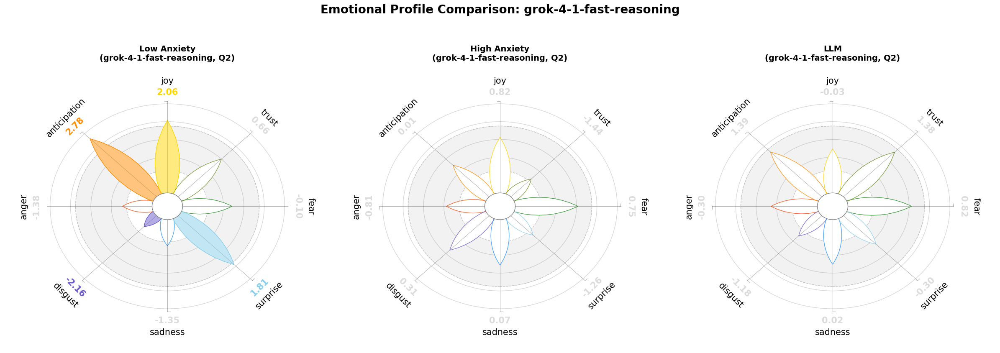

In [54]:
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "grok-4-1-fast-reasoning", 2)

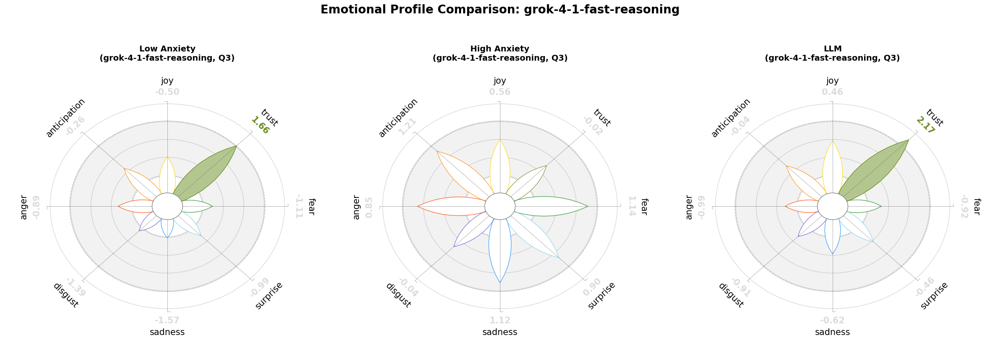

In [55]:
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "grok-4-1-fast-reasoning", 3)

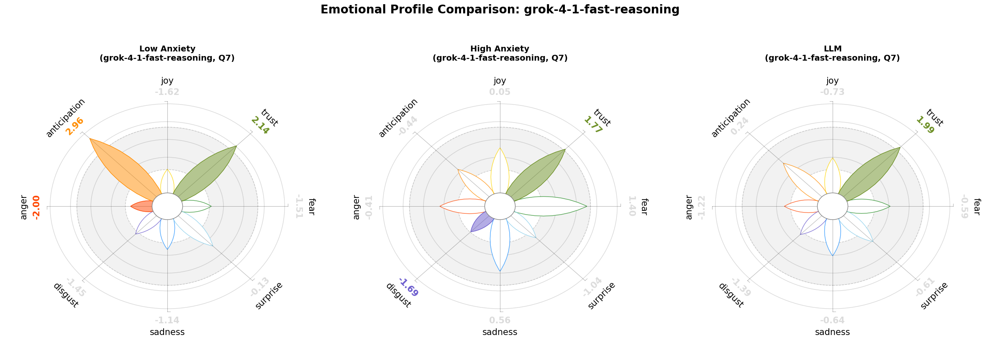

In [56]:
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "grok-4-1-fast-reasoning", 7)

# Qwen3 4B (Thinking)

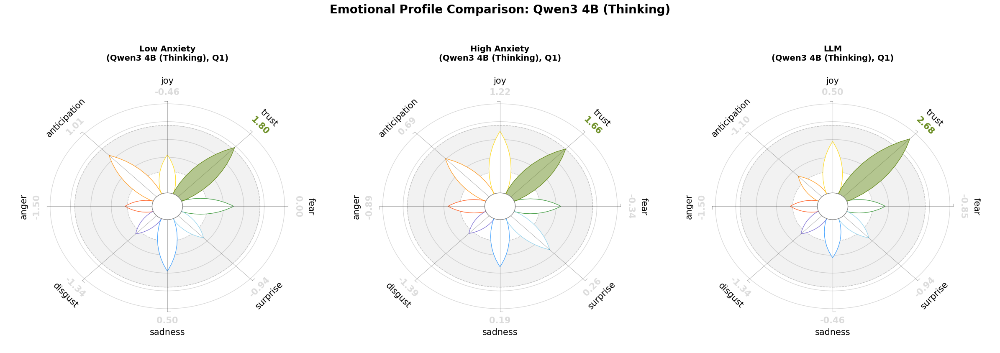

In [57]:
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "Qwen3 4B (Thinking)", 1)

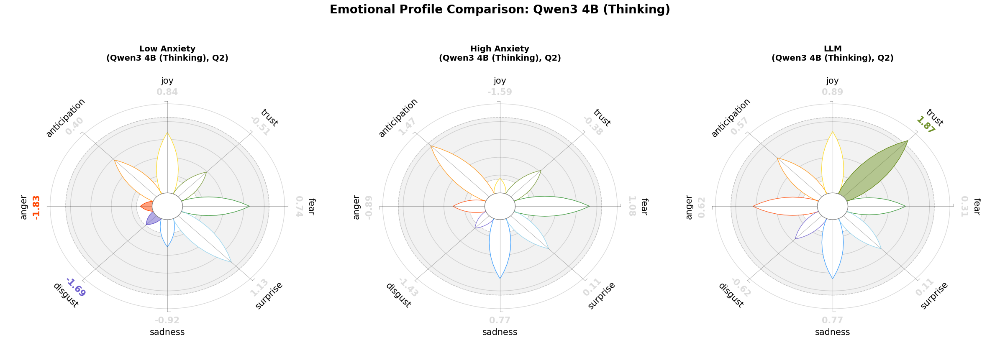

In [58]:
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "Qwen3 4B (Thinking)", 2)

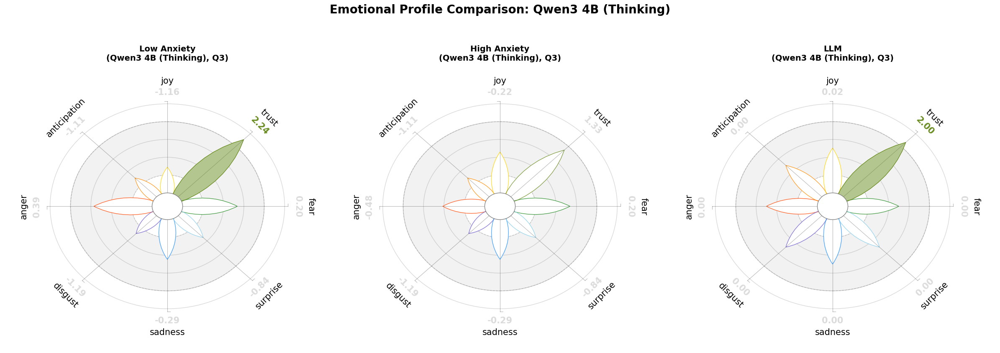

In [59]:
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "Qwen3 4B (Thinking)", 3)

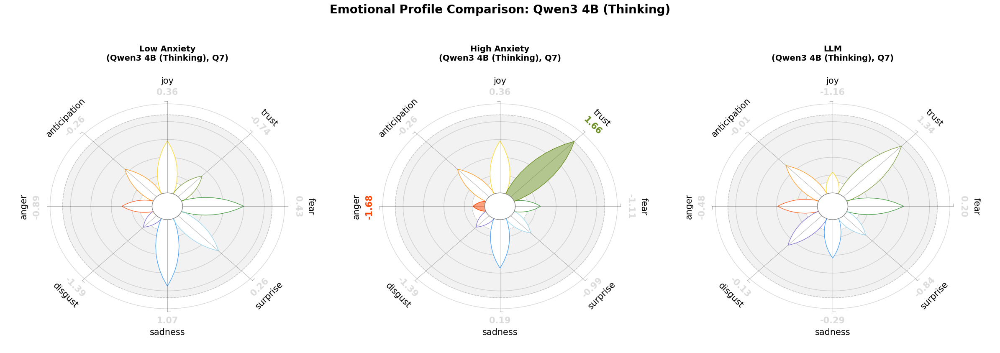

In [60]:
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "Qwen3 4B (Thinking)", 7)

# Mistral Small 4

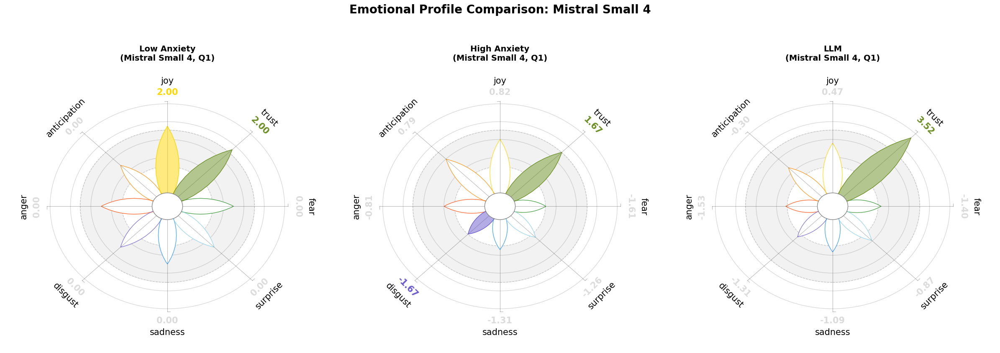

In [61]:
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "Mistral Small 4", 1)

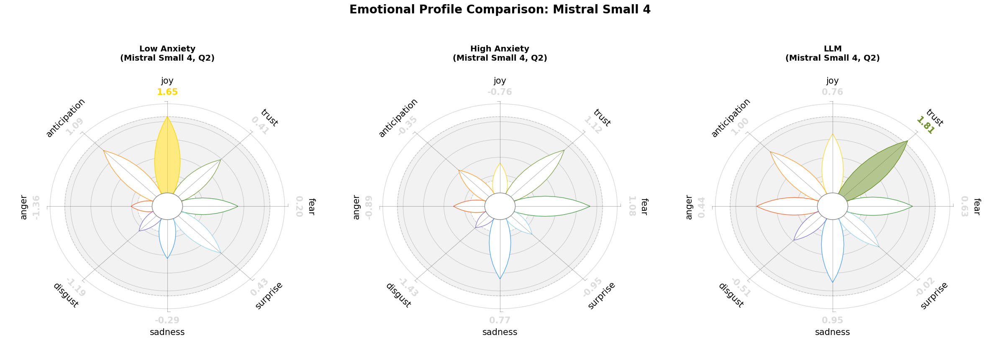

In [62]:
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "Mistral Small 4", 2)

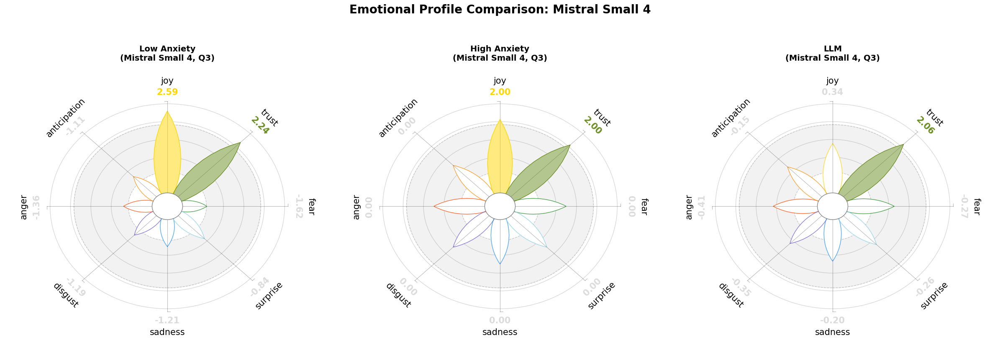

In [63]:
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "Mistral Small 4", 3)

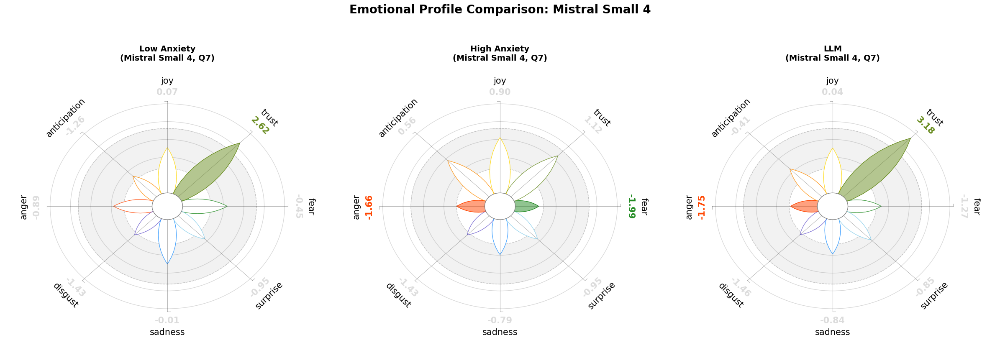

In [64]:
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "Mistral Small 4", 7)

# DeepSeek Chat

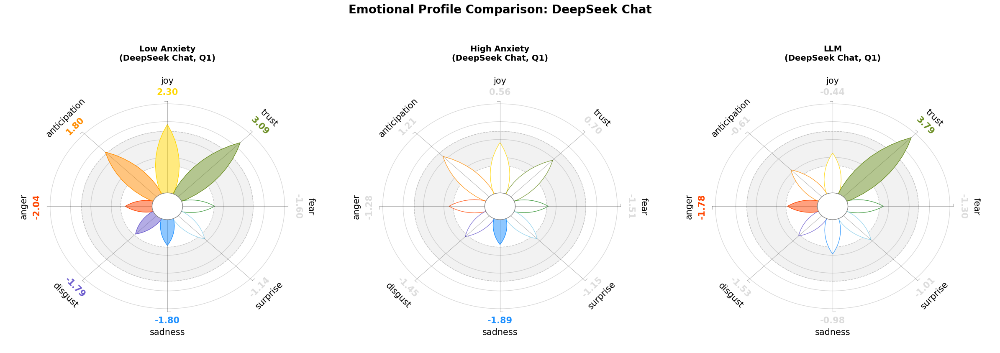

In [65]:
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "DeepSeek Chat", 1)

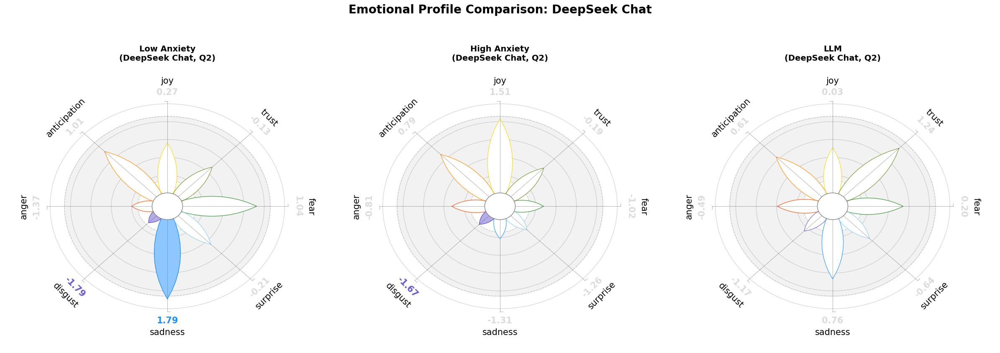

In [66]:
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "DeepSeek Chat", 2)

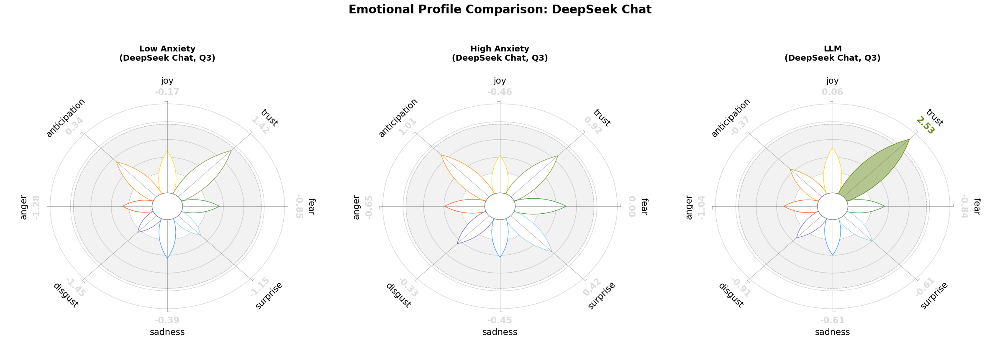

In [67]:
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "DeepSeek Chat", 3)

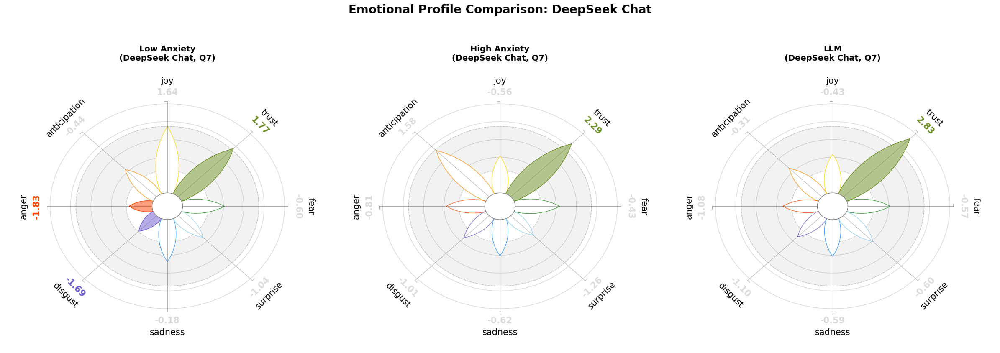

In [68]:
plot_final_plutchik_comparison_triple(df_anxiety_zscore, llm_df_agg, "DeepSeek Chat", 7)

# Summary Table For Anxiety Levels

In [69]:
df_anxiety_zscore.columns

Index(['model_name_x', 'run_id', 'mode_x', 'question_number', 'answer_text',
       'z_scores_anger', 'z_scores_trust', 'z_scores_surprise',
       'z_scores_disgust', 'z_scores_joy', 'z_scores_sadness', 'z_scores_fear',
       'z_scores_anticipation', 'model_name_y', 'mode_y', 'age', 'gender',
       'sexual_orientation', 'city_of_living', 'employment_status',
       'education_level', 'marital_status', 'children', 'migration_status',
       'religious_beliefs', 'parent_1_education', 'parent_2_education',
       'hobbies', 'fav_subjects', 'hat_subjects', 'ocean_openness_score',
       'ocean_openness_level', 'ocean_conscientiousness_score',
       'ocean_conscientiousness_level', 'ocean_extraversion_score',
       'ocean_extraversion_level', 'ocean_agreeableness_score',
       'ocean_agreeableness_level', 'ocean_neuroticism_score',
       'ocean_neuroticism_level', 'amas_score', 'mseaq_score', 'anxiety_score',
       'anxiety_level'],
      dtype='str')

In [70]:
# version without question grouping
main_table = df_anxiety_zscore.groupby(["model_name_x", "question_number", "anxiety_level"]).agg(
    mean_z_score_anger = ("z_scores_anger", "mean"),
    mean_z_score_trust = ("z_scores_trust", "mean"),
    mean_z_score_surprise = ("z_scores_surprise", "mean"),
    mean_z_score_disgust = ("z_scores_disgust", "mean"),
    mean_z_score_joy = ("z_scores_joy", "mean"),
    mean_z_score_sadness = ("z_scores_sadness", "mean"),
    mean_z_score_fear = ("z_scores_fear", "mean"),
    mean_z_score_anticipation = ("z_scores_anticipation", "mean"),
).reset_index()

In [71]:
main_table[main_table["question_number"] == 1]

,model_name_x,question_number,anxiety_level,mean_z_score_anger,mean_z_score_trust,mean_z_score_surprise,mean_z_score_disgust,mean_z_score_joy,mean_z_score_sadness,mean_z_score_fear,mean_z_score_anticipation
0,Anita 24B (Uncensored),1,high_anxiety,-0.285671,1.609572,-0.041179,-1.136198,0.871986,-0.349778,-0.220864,0.856032
1,Anita 24B (Uncensored),1,low_anxiety,-0.651211,1.712613,-0.161419,-1.165510,1.338656,-0.602281,-0.479565,1.058752
14,DeepSeek Chat,1,high_anxiety,-1.159784,1.968952,-0.495384,-1.346555,1.710647,-0.805536,-1.014004,1.307519
15,DeepSeek Chat,1,low_anxiety,-1.578297,2.362401,-0.587661,-1.440014,2.083994,-1.014912,-1.332720,1.530875
28,Granite 4 Tiny,1,high_anxiety,-0.313141,1.270613,-0.172764,-0.528889,0.612604,-0.077454,0.148153,0.424154
29,Granite 4 Tiny,1,low_anxiety,-0.398909,1.309183,-0.204113,-0.578615,0.654307,-0.163606,0.161581,0.480098
42,Magistral Small,1,high_anxiety,-0.053408,1.508483,-0.271235,-0.622061,0.733670,-0.082779,0.058518,0.499975
43,Magistral Small,1,low_anxiety,-0.361088,1.666043,-0.309608,-0.732644,1.255531,-0.293608,-0.154737,0.753220
56,Ministral 14B (Reasoning),1,high_anxiety,-0.786646,2.004862,-0.108766,-1.124196,0.637758,-0.383215,-0.676826,0.588786
57,Ministral 14B (Reasoning),1,low_anxiety,-0.899012,2.035532,-0.173213,-1.167237,0.948113,-0.444154,-0.675934,0.754315


In [72]:
main_table[main_table["question_number"] == 2]

,model_name_x,question_number,anxiety_level,mean_z_score_anger,mean_z_score_trust,mean_z_score_surprise,mean_z_score_disgust,mean_z_score_joy,mean_z_score_sadness,mean_z_score_fear,mean_z_score_anticipation
2,Anita 24B (Uncensored),2,high_anxiety,-0.295796,-0.106378,0.038774,-1.012669,-0.211511,0.813115,1.323663,1.194309
3,Anita 24B (Uncensored),2,low_anxiety,-0.355616,-0.169457,0.193599,-1.136750,0.185813,0.570397,0.976033,1.178480
16,DeepSeek Chat,2,high_anxiety,-0.770399,-0.314445,0.041243,-1.337894,-0.161079,0.636710,1.390598,1.840332
17,DeepSeek Chat,2,low_anxiety,-0.499180,-0.302427,-0.076533,-1.346719,0.164889,0.033521,1.204086,1.548257
30,Granite 4 Tiny,2,high_anxiety,-0.006493,0.080566,-0.003974,-0.693752,-0.370876,0.691539,1.508242,0.869170
31,Granite 4 Tiny,2,low_anxiety,-0.031261,0.017504,0.029705,-0.690669,-0.360778,0.736219,1.581417,0.898017
44,Magistral Small,2,high_anxiety,-0.111357,0.211533,-0.058052,-0.521654,-0.123417,0.713079,1.414182,0.943604
45,Magistral Small,2,low_anxiety,-0.096903,0.282725,0.015887,-0.525984,0.141243,0.541758,1.268563,0.871140
58,Ministral 14B (Reasoning),2,high_anxiety,-0.461789,-0.010661,0.216378,-1.063483,-0.592570,0.485327,1.133579,0.597856
59,Ministral 14B (Reasoning),2,low_anxiety,-0.483260,-0.010392,0.386647,-1.111946,-0.509188,0.504557,0.935308,0.743289


In [73]:
main_table[main_table["question_number"] == 3]

,model_name_x,question_number,anxiety_level,mean_z_score_anger,mean_z_score_trust,mean_z_score_surprise,mean_z_score_disgust,mean_z_score_joy,mean_z_score_sadness,mean_z_score_fear,mean_z_score_anticipation
4,Anita 24B (Uncensored),3,high_anxiety,-0.372036,1.296243,0.101475,-0.456598,0.439165,0.064952,-0.054783,0.686129
5,Anita 24B (Uncensored),3,low_anxiety,-0.537523,1.344593,-0.025725,-0.544144,0.670789,-0.041391,-0.187254,0.548528
18,DeepSeek Chat,3,high_anxiety,-0.904910,1.264454,-0.453164,-1.063105,0.533571,-0.434260,-0.610910,0.611692
19,DeepSeek Chat,3,low_anxiety,-1.367657,1.666848,-0.421380,-1.221993,0.861411,-0.877145,-1.102408,0.584023
32,Granite 4 Tiny,3,high_anxiety,-0.185587,1.464572,-0.059697,-0.211628,0.196791,0.078029,0.212331,0.070963
33,Granite 4 Tiny,3,low_anxiety,-0.136075,1.516546,-0.041170,-0.173144,0.244445,0.040053,0.225240,0.101214
46,Magistral Small,3,high_anxiety,0.000136,1.199712,0.007379,-0.117424,0.284781,0.152391,0.265763,0.320016
47,Magistral Small,3,low_anxiety,-0.165197,1.471507,-0.035245,-0.186795,0.415659,0.070307,0.054026,0.297969
60,Ministral 14B (Reasoning),3,high_anxiety,-0.517090,1.759665,0.128073,-0.662960,0.061145,-0.078826,-0.331236,0.388325
61,Ministral 14B (Reasoning),3,low_anxiety,-0.700299,1.855654,-0.001055,-0.747816,0.107824,-0.213273,-0.444298,0.347811


In [74]:
main_table[main_table["question_number"] == 7]

,model_name_x,question_number,anxiety_level,mean_z_score_anger,mean_z_score_trust,mean_z_score_surprise,mean_z_score_disgust,mean_z_score_joy,mean_z_score_sadness,mean_z_score_fear,mean_z_score_anticipation
12,Anita 24B (Uncensored),7,high_anxiety,-0.206786,1.702114,-0.010111,-0.442411,-0.098619,0.478949,0.207317,0.024536
13,Anita 24B (Uncensored),7,low_anxiety,-0.292891,1.862875,-0.088400,-0.375600,0.004038,0.244259,0.041887,-0.106398
26,DeepSeek Chat,7,high_anxiety,-1.090125,2.447743,-0.549467,-1.501672,-0.512433,-0.118887,-0.331167,0.737547
27,DeepSeek Chat,7,low_anxiety,-1.290415,2.699732,-0.551107,-1.457374,-0.376690,-0.358737,-0.645928,0.341460
40,Granite 4 Tiny,7,high_anxiety,-0.211001,1.717166,-0.156448,-0.238949,-0.131004,0.042072,0.032071,-0.043263
41,Granite 4 Tiny,7,low_anxiety,-0.210238,1.720300,-0.146732,-0.240189,-0.116497,0.062812,0.064122,-0.066878
54,Magistral Small,7,high_anxiety,-0.552847,2.021415,-0.132016,-0.812284,-0.351389,0.444664,0.026504,-0.156756
55,Magistral Small,7,low_anxiety,-0.713493,2.292846,-0.195302,-0.794826,-0.214695,0.121467,-0.221050,-0.259635
68,Ministral 14B (Reasoning),7,high_anxiety,-1.096498,1.992315,-0.003390,-1.292526,-0.323486,0.141099,-0.506954,-0.135159
69,Ministral 14B (Reasoning),7,low_anxiety,-1.163957,1.995791,-0.050553,-1.274156,-0.346543,0.087042,-0.589817,-0.133353


/var/folders/mr/318qq8ns08140x5d2pm9yxh80000gn/T/ipykernel_1584/4234023815.py:28: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  g = sns.catplot(


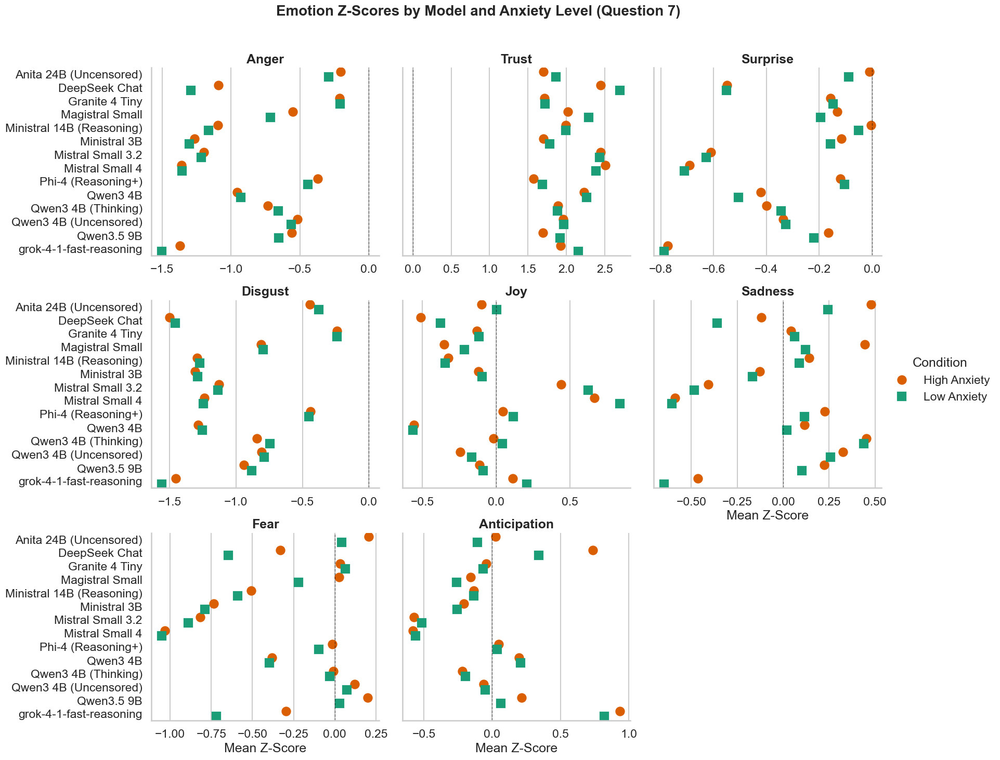

In [75]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Isolate the data for Question 7 (as shown in your screenshot)
df_q7 = main_table[main_table["question_number"] == 7].copy()

# 2. Identify all emotion columns dynamically
emotion_cols = [col for col in df_q7.columns if "mean_z_score_" in col]

# 3. Melt the data from "wide" to "long" format for Seaborn
df_long = df_q7.melt(
    id_vars=["model_name_x", "anxiety_level"],
    value_vars=emotion_cols,
    var_name="emotion",
    value_name="z_score"
)

# 4. Clean up the emotion labels for better presentation (e.g., 'mean_z_score_anger' -> 'Anger')
df_long["emotion"] = df_long["emotion"].str.replace("mean_z_score_", "").str.title()
df_long["anxiety_level"] = df_long["anxiety_level"].str.replace("_", " ").str.title()

# 5. Set up the plotting theme
sns.set_theme(style="whitegrid", context="talk")

# 6. Create the FacetGrid with categorical dot plots (pointplot) 
# Pointplots are excellent for showing shifts (deltas) between two states without cluttering the graph with heavy bars.
g = sns.catplot(
    data=df_long,
    x="z_score",
    y="model_name_x",
    hue="anxiety_level",
    col="emotion",
    col_wrap=3,          # Adjust depending on how many emotions you have
    kind="point",        # Using points and lines to show the "shift" between low and high
    join=False,          # Do not connect different models with lines
    dodge=0.4,           # Separate the high/low dots slightly on the y-axis
    palette={"High Anxiety": "#d95f02", "Low Anxiety": "#1b9e77"}, # Colorblind friendly palette
    markers=["o", "s"],  # Different shapes for accessibility
    height=5,
    aspect=1.2,
    sharex=False         # Allows each emotion's X-axis to scale independently to better show internal variance
)

# 7. Polish the aesthetics
g.set_titles("{col_name}", weight="bold")
g.set_axis_labels("Mean Z-Score", "")
g.legend.set_title("Condition")

# Add a vertical reference line at Z = 0 for every subplot
for ax in g.axes.flat:
    ax.axvline(0, color='black', linestyle='--', linewidth=1, alpha=0.5)

# Tweak the overall layout to make room for a main title
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Emotion Z-Scores by Model and Anxiety Level (Question 7)", fontsize=20, weight="bold")

plt.show()

/var/folders/mr/318qq8ns08140x5d2pm9yxh80000gn/T/ipykernel_1584/1252802141.py:28: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  g = sns.catplot(


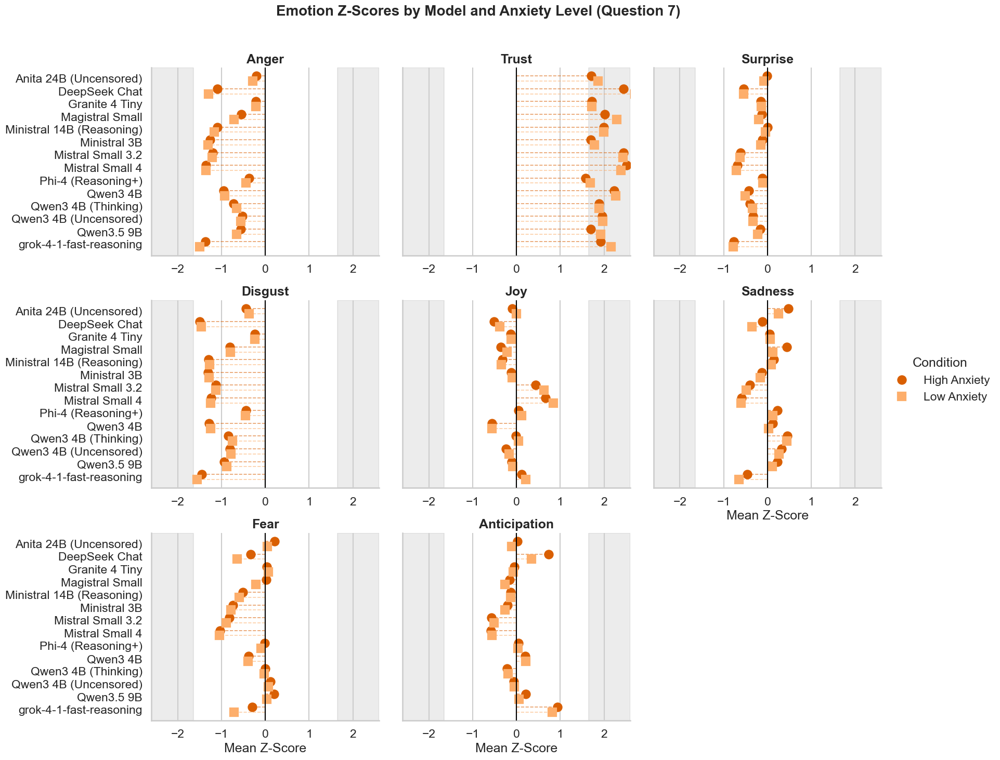

In [81]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Isolate the data for Question 7 (as shown in your screenshot)
df_q7 = main_table[main_table["question_number"] == 7].copy()

# 2. Identify all emotion columns dynamically
emotion_cols = [col for col in df_q7.columns if "mean_z_score_" in col]

# 3. Melt the data from "wide" to "long" format for Seaborn
df_long = df_q7.melt(
    id_vars=["model_name_x", "anxiety_level"],
    value_vars=emotion_cols,
    var_name="emotion",
    value_name="z_score"
)

# 4. Clean up the emotion labels for better presentation
df_long["emotion"] = df_long["emotion"].str.replace("mean_z_score_", "").str.title()
df_long["anxiety_level"] = df_long["anxiety_level"].str.replace("_", " ").str.title()

# 5. Set up the plotting theme
sns.set_theme(style="whitegrid", context="talk")

# 6. Create the FacetGrid with categorical dot plots (pointplot) 
g = sns.catplot(
    data=df_long,
    x="z_score",
    y="model_name_x",
    hue="anxiety_level",
    col="emotion",
    col_wrap=3,          
    kind="point",        
    join=False,          
    dodge=0.4,           
    # MODIFICA: Palette aggiornata con un arancione scuro e uno più chiaro
    palette={"High Anxiety": "#d95f02", "Low Anxiety": "#fdae6b"}, 
    markers=["o", "s"],  
    height=5,
    aspect=1.2,
    # MODIFICA: Impostato su True affinché tutte le facce condividano la stessa scala x
    sharex=False          
)

# 7. Polish the aesthetics
g.set_titles("{col_name}", weight="bold")
g.set_axis_labels("Mean Z-Score", "")
g.legend.set_title("Condition")

# MODIFICA: Ciclo su tutti i subplot per aggiungere regioni, assi e tratteggi
for ax in g.axes.flat:
    # A. Fissa esplicitamente i limiti dell'asse X da -2.6 a 2.6
    ax.set_xlim(-2.6, 2.6)
    
    # B. Aggiungi la regione di rifiuto (fasce grigie sullo sfondo, zorder=0)
    ax.axvspan(-2.6, -1.645, color='gray', alpha=0.15, zorder=0)
    ax.axvspan(1.645, 2.6, color='gray', alpha=0.15, zorder=0)
    
    # C. Asse verticale solido e marcato allo 0
    ax.axvline(0, color='black', linestyle='-', linewidth=1.5, zorder=3)
    
    # D. Aggiungi i trattini dallo 0 al punto
    # Poiché il parametro 'dodge=0.4' sfalsa i punti sull'asse Y, andiamo a 
    # estrarre le coordinate esatte (X, Y) direttamente dagli elementi grafici disegnati.
    for line in ax.lines:
        # Filtriamo solo gli elementi che hanno i marker da noi scelti ('o' e 's')
        if line.get_marker() in ['o', 's']:
            x_data = line.get_xdata()
            y_data = line.get_ydata()
            marker_color = line.get_color() # Possiamo usare il colore del punto, o forzare 'gray'
            
            # Tracciamo una linea orizzontale per ogni punto di questa categoria
            for x, y in zip(x_data, y_data):
                if pd.notna(x) and pd.notna(y):
                    ax.hlines(y=y, xmin=0, xmax=x, color=marker_color, 
                              linestyle='--', linewidth=1.2, alpha=0.6, zorder=1)

# Tweak the overall layout to make room for a main title
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Emotion Z-Scores by Model and Anxiety Level (Question 7)", fontsize=20, weight="bold")

plt.show()

/var/folders/mr/318qq8ns08140x5d2pm9yxh80000gn/T/ipykernel_1584/380120929.py:28: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  g = sns.catplot(


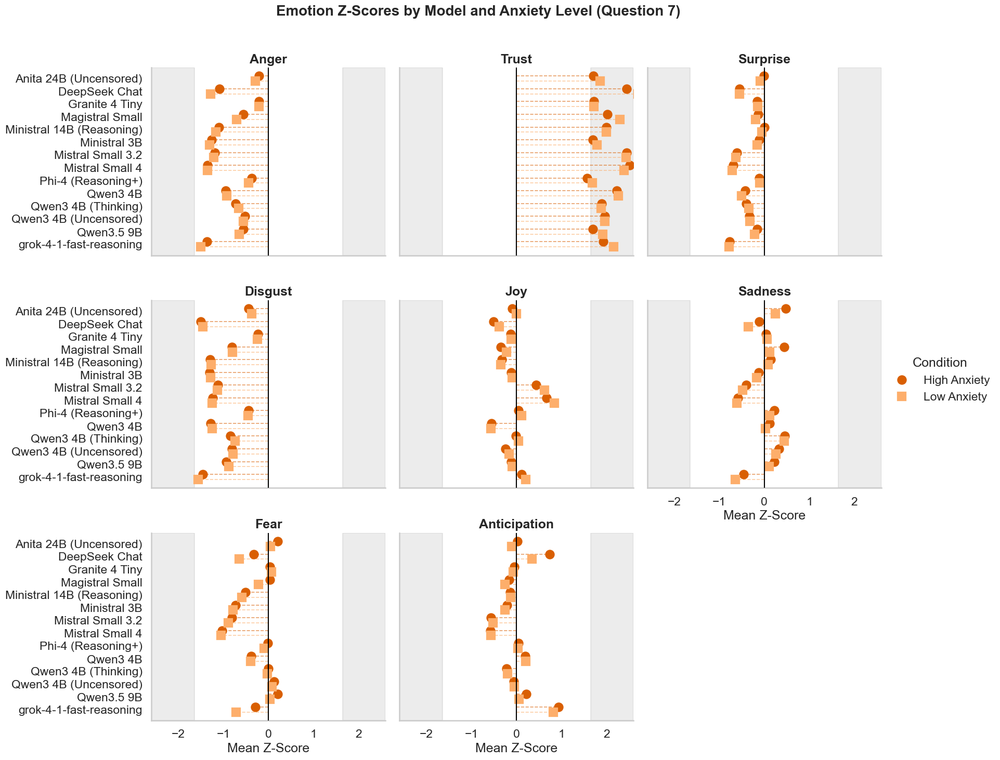

In [83]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Isolate the data for Question 7 (as shown in your screenshot)
df_q7 = main_table[main_table["question_number"] == 7].copy()

# 2. Identify all emotion columns dynamically
emotion_cols = [col for col in df_q7.columns if "mean_z_score_" in col]

# 3. Melt the data from "wide" to "long" format for Seaborn
df_long = df_q7.melt(
    id_vars=["model_name_x", "anxiety_level"],
    value_vars=emotion_cols,
    var_name="emotion",
    value_name="z_score"
)

# 4. Clean up the emotion labels for better presentation
df_long["emotion"] = df_long["emotion"].str.replace("mean_z_score_", "").str.title()
df_long["anxiety_level"] = df_long["anxiety_level"].str.replace("_", " ").str.title()

# 5. Set up the plotting theme
sns.set_theme(style="whitegrid", context="talk")

# 6. Create the FacetGrid with categorical dot plots (pointplot) 
g = sns.catplot(
    data=df_long,
    x="z_score",
    y="model_name_x",
    hue="anxiety_level",
    col="emotion",
    col_wrap=3,          
    kind="point",        
    join=False,          
    dodge=0.4,           
    palette={"High Anxiety": "#d95f02", "Low Anxiety": "#fdae6b"}, 
    markers=["o", "s"],  
    height=5,
    aspect=1.2,
    sharex=True          
)

# 7. Polish the aesthetics
g.set_titles("{col_name}", weight="bold")
g.set_axis_labels("Mean Z-Score", "")
g.legend.set_title("Condition")

# Ciclo su tutti i subplot per aggiungere regioni, assi e tratteggi
for ax in g.axes.flat:
    # A. Fissa esplicitamente i limiti dell'asse X da -2.6 a 2.6
    ax.set_xlim(-2.6, 2.6)
    
    # NUOVO: Rimuove le linee verticali di default della griglia (ai valori -2, -1, 1, 2)
    ax.xaxis.grid(False)
    
    # B. Aggiungi la regione di rifiuto (fasce grigie sullo sfondo, zorder=0)
    ax.axvspan(-2.6, -1.645, color='gray', alpha=0.15, zorder=0)
    ax.axvspan(1.645, 2.6, color='gray', alpha=0.15, zorder=0)
    
    # C. Asse verticale solido e marcato allo 0
    ax.axvline(0, color='black', linestyle='-', linewidth=1.5, zorder=3)
    
    # D. Aggiungi i trattini dallo 0 al punto
    for line in ax.lines:
        if line.get_marker() in ['o', 's']:
            x_data = line.get_xdata()
            y_data = line.get_ydata()
            marker_color = line.get_color() 
            
            for x, y in zip(x_data, y_data):
                if pd.notna(x) and pd.notna(y):
                    ax.hlines(y=y, xmin=0, xmax=x, color=marker_color, 
                              linestyle='--', linewidth=1.2, alpha=0.6, zorder=1)

# Tweak the overall layout to make room for a main title
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Emotion Z-Scores by Model and Anxiety Level (Question 7)", fontsize=20, weight="bold")

plt.show()

/var/folders/mr/318qq8ns08140x5d2pm9yxh80000gn/T/ipykernel_1584/4175064851.py:28: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  g = sns.catplot(


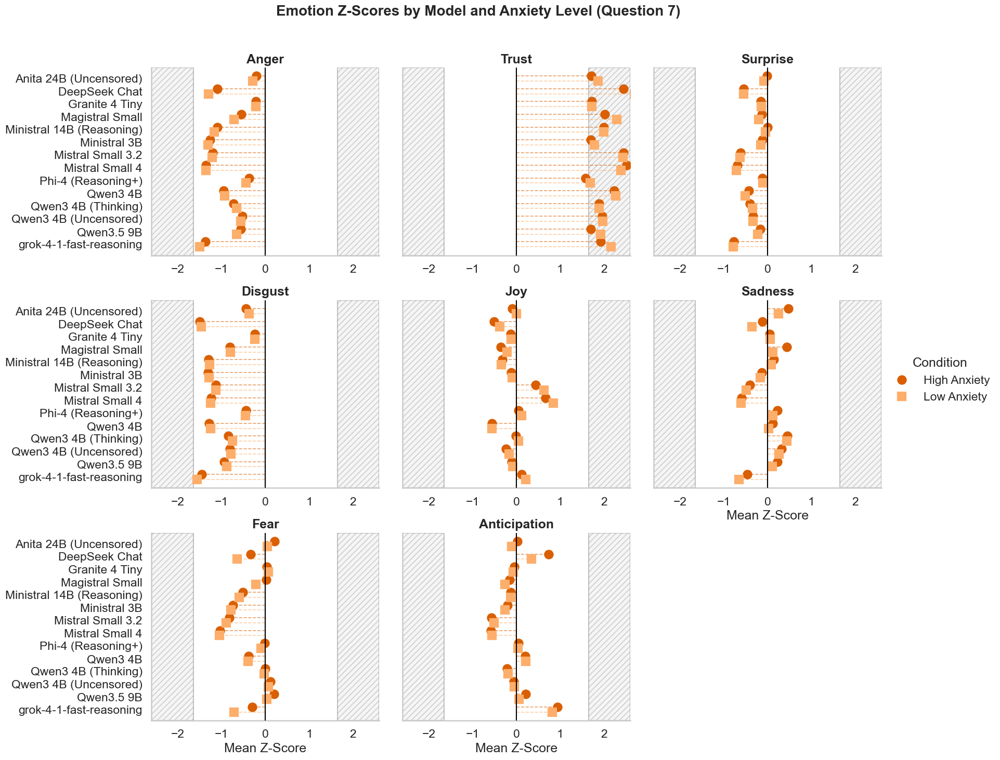

In [85]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Isolate the data for Question 7
df_q7 = main_table[main_table["question_number"] == 7].copy()

# 2. Identify all emotion columns dynamically
emotion_cols = [col for col in df_q7.columns if "mean_z_score_" in col]

# 3. Melt the data from "wide" to "long" format for Seaborn
df_long = df_q7.melt(
    id_vars=["model_name_x", "anxiety_level"],
    value_vars=emotion_cols,
    var_name="emotion",
    value_name="z_score"
)

# 4. Clean up the emotion labels for better presentation
df_long["emotion"] = df_long["emotion"].str.replace("mean_z_score_", "").str.title()
df_long["anxiety_level"] = df_long["anxiety_level"].str.replace("_", " ").str.title()

# 5. Set up the plotting theme
sns.set_theme(style="whitegrid", context="talk")

# 6. Create the FacetGrid with categorical dot plots (pointplot) 
g = sns.catplot(
    data=df_long,
    x="z_score",
    y="model_name_x",
    hue="anxiety_level",
    col="emotion",
    col_wrap=3,          
    kind="point",        
    join=False,          
    dodge=0.4,           
    palette={"High Anxiety": "#d95f02", "Low Anxiety": "#fdae6b"}, 
    markers=["o", "s"],  
    height=5,
    aspect=1.2,
    sharex=False          
)

# 7. Polish the aesthetics
g.set_titles("{col_name}", weight="bold")
g.set_axis_labels("Mean Z-Score", "")
g.legend.set_title("Condition")

# Loop over all subplots to add regions, axes, and lines
for ax in g.axes.flat:
    # A. Fix the X-axis limits explicitly from -2.6 to 2.6
    ax.set_xlim(-2.6, 2.6)
    
    # B. Remove default vertical grid lines
    ax.xaxis.grid(False)
    
    # C. Add the Shaded Rejection Regions
    # Left rejection region (-2.6 to -1.645)
    ax.axvspan(-2.6, -1.645, color='gray', alpha=0.08, zorder=0) # Faint background
    ax.axvspan(-2.6, -1.645, facecolor='none', edgecolor='gray', hatch='///', alpha=0.4, zorder=0) # Shading/hatch
    
    # Right rejection region (1.645 to 2.6)
    ax.axvspan(1.645, 2.6, color='gray', alpha=0.08, zorder=0) # Faint background
    ax.axvspan(1.645, 2.6, facecolor='none', edgecolor='gray', hatch='///', alpha=0.4, zorder=0) # Shading/hatch
    
    # D. Solid vertical axis at 0
    ax.axvline(0, color='black', linestyle='-', linewidth=1.5, zorder=3)
    
    # E. Add the dashed lines from 0 to the point
    for line in ax.lines:
        if line.get_marker() in ['o', 's']:
            x_data = line.get_xdata()
            y_data = line.get_ydata()
            marker_color = line.get_color() 
            
            for x, y in zip(x_data, y_data):
                if pd.notna(x) and pd.notna(y):
                    ax.hlines(y=y, xmin=0, xmax=x, color=marker_color, 
                              linestyle='--', linewidth=1.2, alpha=0.6, zorder=1)

# Tweak the overall layout to make room for a main title
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Emotion Z-Scores by Model and Anxiety Level (Question 7)", fontsize=20, weight="bold")

plt.show()

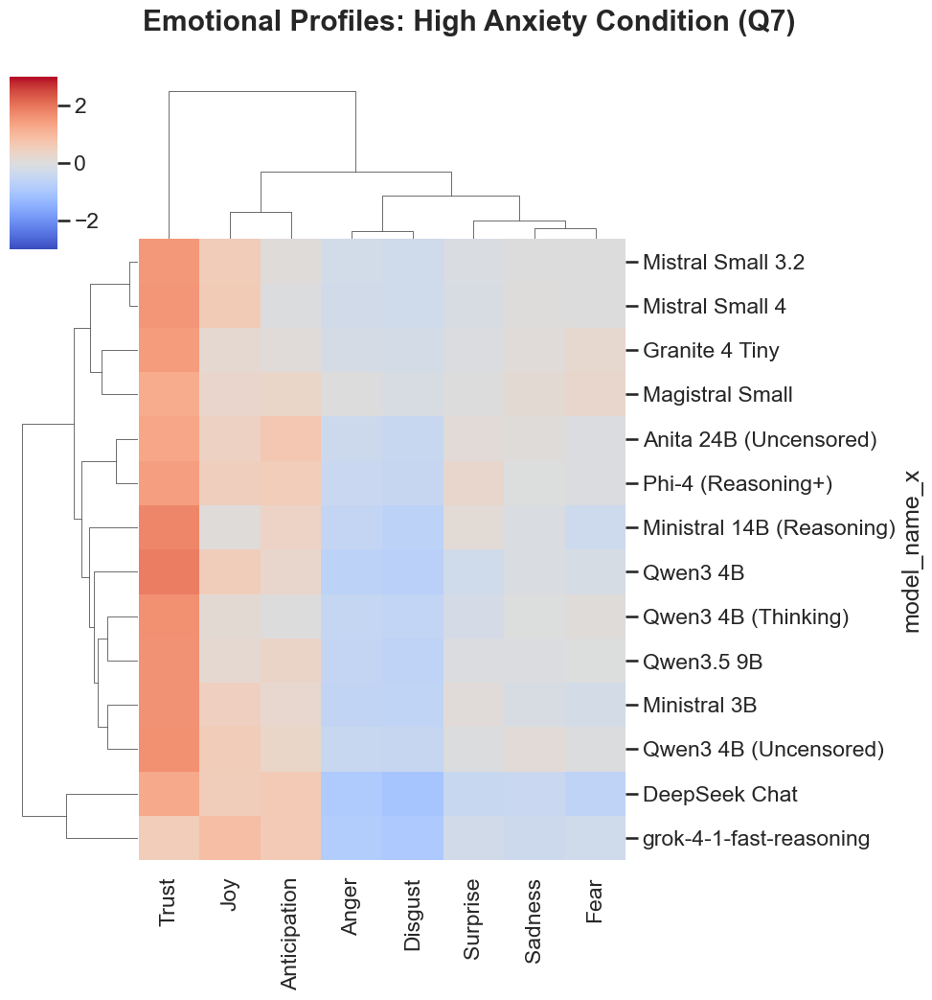

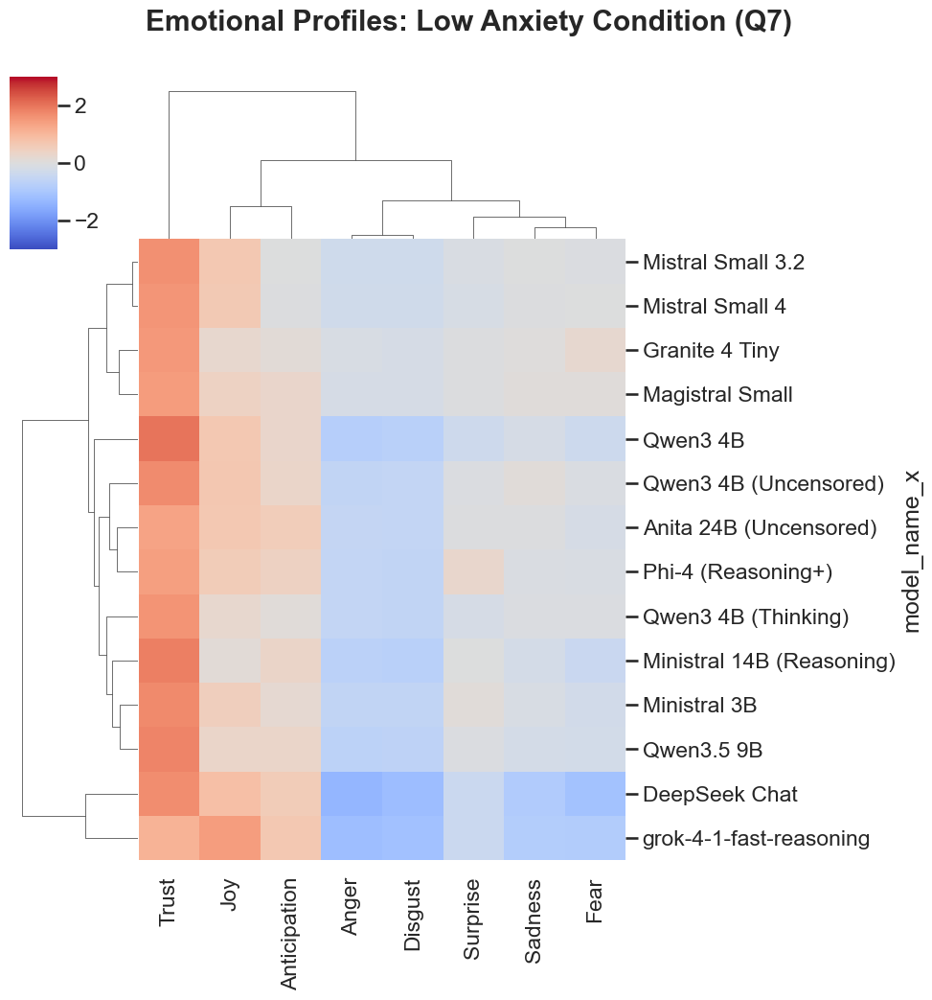

In [79]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Isolate the data for Question 7 (from your source screenshot, image_1.png)
df_q7 = main_table[main_table["question_number"] == 3].copy()

# 2. Reshape the data for immediate heatmap use (no complex melting required).
# We want the Index to be (Model, Anxiety), and the Columns to be the Emotions.
heatmap_data = df_q7.set_index(["model_name_x", "anxiety_level"])

# 3. Keep only the columns containing mean Z-scores and simplify their names for readability.
z_score_cols = [col for col in heatmap_data.columns if col.startswith("mean_z_score_")]
heatmap_data = heatmap_data[z_score_cols]

# Clean column names (e.g., 'mean_z_score_anger' becomes 'Anger')
heatmap_data.columns = [col.replace("mean_z_score_", "").title() for col in heatmap_data.columns]

# --- Build the visual: Clustered Heatmaps (Clustermap) ---

# We generate two distinct maps side-by-side to contrast the anxiety conditions.
# Seaborn's clustermap is incredibly intuitive because it performs hierarchical
# clustering (grouping models that behave similarly) automatically.

# 4. Global aesthetics for both maps
# A 'diverging' color palette is essential here (blue=low Z, red=high Z, zero=white/neutral).
# We fix the min/max values (-3 to 3) to ensure a standard visual comparison.
common_args = {
    "cmap": "coolwarm",        # Diverging blue-white-red palette
    "vmin": -3, "vmax": 3,      # Standardize the Z-score range
    "annot": False,            # Don't clutter the map with raw numbers; use color for meaning.
    "yticklabels": True        # Show model names on the y-axis.
}

# Generate Map 1: High Anxiety
g_high = sns.clustermap(
    data=heatmap_data.xs("high_anxiety", level="anxiety_level"), 
    **common_args
)
# Add the title to the figure object, shifting it slightly up (y=1.05) so it doesn't overlap the dendrogram
g_high.fig.suptitle("Emotional Profiles: High Anxiety Condition (Q7)", y=1.05, weight="bold")

# Generate Map 2: Low Anxiety
g_low = sns.clustermap(
    data=heatmap_data.xs("low_anxiety", level="anxiety_level"), 
    **common_args
)
g_low.fig.suptitle("Emotional Profiles: Low Anxiety Condition (Q7)", y=1.05, weight="bold")

plt.show()

In [80]:
# version with question grouping
df_anxiety_zscore.groupby(["model_name_x", "anxiety_level"]).agg(
    mean_z_score_anger = ("z_scores_anger", "mean"),
    mean_z_score_trust = ("z_scores_trust", "mean"),
    mean_z_score_surprise = ("z_scores_surprise", "mean"),
    mean_z_score_disgust = ("z_scores_disgust", "mean"),
    mean_z_score_joy = ("z_scores_joy", "mean"),
    mean_z_score_sadness = ("z_scores_sadness", "mean"),
    mean_z_score_fear = ("z_scores_fear", "mean"),
    mean_z_score_anticipation = ("z_scores_anticipation", "mean"),
).reset_index()

,model_name_x,anxiety_level,mean_z_score_anger,mean_z_score_trust,mean_z_score_surprise,mean_z_score_disgust,mean_z_score_joy,mean_z_score_sadness,mean_z_score_fear,mean_z_score_anticipation
0,Anita 24B (Uncensored),high_anxiety,-0.230227,1.151215,0.054497,-0.500032,0.201467,0.174676,0.170248,0.504879
1,Anita 24B (Uncensored),low_anxiety,-0.336700,1.162479,0.026570,-0.521611,0.384126,0.045994,0.027188,0.483439
2,DeepSeek Chat,high_anxiety,-0.737591,1.391488,-0.172278,-0.929260,0.258940,-0.178244,-0.063697,1.006255
3,DeepSeek Chat,low_anxiety,-0.829367,1.572749,-0.161634,-0.913113,0.468448,-0.415551,-0.289365,0.957221
4,Granite 4 Tiny,high_anxiety,-0.106981,1.118622,-0.039793,-0.255269,0.094442,0.114763,0.319013,0.262275
5,Granite 4 Tiny,low_anxiety,-0.120091,1.149473,-0.035385,-0.254843,0.118045,0.100977,0.329361,0.278760
6,Magistral Small,high_anxiety,-0.112499,1.154923,-0.022301,-0.319778,0.107022,0.197400,0.276283,0.465645
7,Magistral Small,low_anxiety,-0.202837,1.260300,-0.025191,-0.335120,0.262346,0.075414,0.148389,0.468035
8,Ministral 14B (Reasoning),high_anxiety,-0.562316,1.367144,0.195813,-0.702675,-0.028652,-0.010892,-0.109458,0.389434
9,Ministral 14B (Reasoning),low_anxiety,-0.620510,1.429755,0.188256,-0.735931,0.036038,-0.066019,-0.187644,0.429407
